# Processing PUMS data to Migration Flow 

These codes read and preprocess the raw data (csv files) of 2017-2021 PUMS data into population flows

## Load packages

In [134]:
import glob
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import mapclassify
import copy
import os
from scipy.spatial import cKDTree
from shapely.geometry import Point,LineString
import us
import contextily as cx
from geopy.distance import geodesic as GD

plt.rcParams['figure.figsize'] = [15, 15]
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 20)

table_path = "F:/PUMS/Tables/"
GIS_path = "F:/PUMS/GIS_data/"
intermediate_path = table_path + "intermediate_output/"

## Combine separate 5-year PUMS (csv) files to a dataframe

The combined dataframe (df) is very large. Please refer to this [document ](https://www2.census.gov/programs-surveys/acs/tech_docs/pums/data_dict/PUMS_Data_Dictionary_2016-2020.pdf) for the meanings of the columns.

In [2]:
# Getting a list of raw csv files starting with "psam_pu"
# These data are 2015-2019 5-year data downloaded from https://www.census.gov/programs-surveys/acs/microdata/access.html
f_ls = glob.glob(table_path+'raw_data/5_years/2015-2019/psam_pus*')

# test the list
df_ls=[]
for f in f_ls:
    print(f)
    df_ls.append(pd.read_csv(f))
    
df = pd.concat(df_ls)

F:/PUMS/Tables/raw_data/5_years/2015-2019\psam_pusa.csv


C:\Users\xiang11\AppData\Local\Temp\ipykernel_25312\2178602487.py:9: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  df_ls.append(pd.read_csv(f))


F:/PUMS/Tables/raw_data/5_years/2015-2019\psam_pusb.csv


C:\Users\xiang11\AppData\Local\Temp\ipykernel_25312\2178602487.py:9: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  df_ls.append(pd.read_csv(f))


F:/PUMS/Tables/raw_data/5_years/2015-2019\psam_pusc.csv


C:\Users\xiang11\AppData\Local\Temp\ipykernel_25312\2178602487.py:9: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  df_ls.append(pd.read_csv(f))


F:/PUMS/Tables/raw_data/5_years/2015-2019\psam_pusd.csv


C:\Users\xiang11\AppData\Local\Temp\ipykernel_25312\2178602487.py:9: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  df_ls.append(pd.read_csv(f))


In [3]:
puma = gpd.read_file(GIS_path+'GIS_data/ipums_puma_2010.shp')
migpuma = gpd.read_file(GIS_path+"GIS_data/ipums_migpuma_pwpuma_2010.shp")
puma['PUMA2'] = puma['STATEFIP'] + puma['PUMA']
# combine state code and MIGPUMA code
migpuma['MIGPUMA2'] = migpuma['STATEFIP'] + migpuma['MIGPUMA']

## Combine 
#### Delete NaN records and store the year of the records in a new column

In [4]:
df1 = df[~df['SERIALNO'].isna()]
df1['year'] = df1['SERIALNO'].astype(str).str[0:4]

In [5]:
df1.head()

,RT,SERIALNO,DIVISION,SPORDER,PUMA,REGION,ST,ADJINC,PWGTP,AGEP,CIT,CITWP,COW,DDRS,DEAR,DEYE,DOUT,DPHY,DRAT,DRATX,DREM,ENG,FER,GCL,GCM,GCR,HINS1,HINS2,HINS3,HINS4,HINS5,HINS6,HINS7,INTP,JWMNP,JWRIP,JWTRNS,LANX,MAR,MARHD,MARHM,MARHT,MARHW,MARHYP,MIG,MIL,MLPA,MLPB,MLPCD,MLPE,MLPFG,MLPH,MLPI,MLPJ,MLPK,NWAB,NWAV,NWLA,NWLK,NWRE,OIP,PAP,RELSHIPP,RETP,SCH,SCHG,SCHL,SEMP,SEX,SSIP,SSP,WAGP,WKHP,WKL,WKW,WKWN,WRK,YOEP,ANC,ANC1P,ANC2P,DECADE,DIS,DRIVESP,ESP,ESR,FOD1P,FOD2P,HICOV,HISP,INDP,JWAP,JWDP,LANP,MIGPUMA,MIGSP,MSP,NAICSP,NATIVITY,NOP,OC,OCCP,PAOC,PERNP,PINCP,POBP,POVPIP,POWPUMA,POWSP,PRIVCOV,PUBCOV,QTRBIR,RAC1P,RAC2P,RAC3P,RACAIAN,RACASN,RACBLK,RACNH,RACNUM,RACPI,RACSOR,RACWHT,RC,SCIENGP,SCIENGRLP,SFN,SFR,SOCP,VPS,WAOB,FAGEP,FANCP,FCITP,FCITWP,FCOWP,FDDRSP,FDEARP,FDEYEP,FDISP,FDOUTP,FDPHYP,FDRATP,FDRATXP,FDREMP,FENGP,FESRP,FFERP,FFODP,FGCLP,FGCMP,FGCRP,FHICOVP,FHINS1P,FHINS2P,FHINS3C,FHINS3P,FHINS4C,FHINS4P,FHINS5C,FHINS5P,FHINS6P,FHINS7P,FHISP,FINDP,FINTP,FJWDP,FJWMNP,FJWRIP,FJWTRNSP,FLANP,FLANXP,FMARP,FMARHDP,FMARHMP,FMARHTP,FMARHWP,FMARHYP,FMIGP,FMIGSP,FMILPP,FMILSP,FOCCP,FOIP,FPAP,FPERNP,FPINCP,FPOBP,FPOWSP,FPRIVCOVP,FPUBCOVP,FRACP,FRELSHIPP,FRETP,FSCHGP,FSCHLP,FSCHP,FSEMP,FSEXP,FSSIP,FSSP,FWAGP,FWKHP,FWKLP,FWKWNP,FWKWP,FWRKP,FYOEP,PWGTP1,PWGTP2,PWGTP3,PWGTP4,PWGTP5,PWGTP6,PWGTP7,PWGTP8,PWGTP9,PWGTP10,PWGTP11,PWGTP12,PWGTP13,PWGTP14,PWGTP15,PWGTP16,PWGTP17,PWGTP18,PWGTP19,PWGTP20,PWGTP21,PWGTP22,PWGTP23,PWGTP24,PWGTP25,PWGTP26,PWGTP27,PWGTP28,PWGTP29,PWGTP30,PWGTP31,PWGTP32,PWGTP33,PWGTP34,PWGTP35,PWGTP36,PWGTP37,PWGTP38,PWGTP39,PWGTP40,PWGTP41,PWGTP42,PWGTP43,PWGTP44,PWGTP45,PWGTP46,PWGTP47,PWGTP48,PWGTP49,PWGTP50,PWGTP51,PWGTP52,PWGTP53,PWGTP54,PWGTP55,PWGTP56,PWGTP57,PWGTP58,PWGTP59,PWGTP60,PWGTP61,PWGTP62,PWGTP63,PWGTP64,PWGTP65,PWGTP66,PWGTP67,PWGTP68,PWGTP69,PWGTP70,PWGTP71,PWGTP72,PWGTP73,PWGTP74,PWGTP75,PWGTP76,PWGTP77,PWGTP78,PWGTP79,PWGTP80,year
0,P,2015000000067,6,1,2701,3,1,1080470,9,56,1,NaN,6.0,2.0,2,2,2.0,1.0,NaN,NaN,2.0,NaN,NaN,1.0,1.0,1.0,1,2,2,2,2,2,2,0.0,5.0,1.0,1.0,2.0,1,2.0,2.0,1.0,2.0,2002.0,1.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,5.0,3.0,3.0,3.0,0.0,0.0,20,0.0,1.0,NaN,14.0,650.0,1,0.0,0.0,2800.0,5.0,1.0,1.0,NaN,NaN,NaN,4,999,999,NaN,1,1.0,NaN,1.0,NaN,NaN,1,1,9160.0,90.0,50.0,NaN,NaN,NaN,1.0,8131,1,NaN,0.0,2040.0,NaN,3450.0,3450.0,1,91.0,2700.0,1.0,1,2,4,2,2,2,0,0,1,0,1,0,0,0,0.0,NaN,NaN,NaN,NaN,212011,NaN,1,0,0,1,0,1,1,1,1,1,1,1,0,0,1,0,1,0,0,1,1,1,1,1,1,NaN,1,NaN,1,NaN,1,1,1,1,1,1,1,1,1,1,0,1,0,1,1,1,1,1,1,0,0,1,1,1,1,1,1,1,1,1,1,1,0,1,0,1,1,1,0,1,1,1,1,1,0,1,0,0,8,16,9,3,9,4,17,9,2,2,11,10,9,8,8,17,7,3,16,18,9,16,10,2,9,2,17,8,2,4,8,10,8,8,10,12,9,3,15,14,8,17,9,2,9,2,16,8,3,3,9,8,8,9,9,17,8,2,21,15,9,16,10,2,8,3,16,9,3,3,9,10,11,10,11,17,9,3,13,15,2015
1,P,2015000000067,6,2,2701,3,1,1080470,9,61,1,NaN,NaN,2.0,2,2,2.0,2.0,NaN,NaN,2.0,NaN,NaN,1.0,NaN,2.0,1,2,2,2,2,2,2,14000.0,NaN,NaN,NaN,2.0,1,2.0,2.0,1.0,2.0,2002.0,1.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,5.0,3.0,3.0,3.0,0.0,0.0,21,0.0,1.0,NaN,19.0,0.0,2,0.0,0.0,0.0,NaN,3.0,NaN,NaN,NaN,NaN,4,999,999,NaN,2,NaN,NaN,6.0,NaN,NaN,1,1,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1,NaN,0.0,NaN,4.0,0.0,14000.0,1,91.0,NaN,NaN,1,2,4,2,2,2,0,0,1,0,1,0,0,0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,1,0,0,1,0,0,1,1,1,1,1,1,0,0,1,0,1,0,0,1,0,1,1,1,1,NaN,1,NaN,1,NaN,1,1,1,1,0,1,0,0,0,0,0,1,0,1,1,1,1,1,1,0,0,1,0,1,1,1,1,1,0,1,1,1,0,1,0,1,1,1,0,1,1,1,0,1,0,0,0,0,9,17,9,3,9,3,19,9,3,2,11,10,9,8,10,14,8,3,17,18,10,18,11,2,8,3,16,9,3,3,8,10,8,10,10,14,9,3,16,15,8,18,10,3,9,3,19,9,3,4,9,9,9,10,8,17,8,3,20,15,10,16,11,4,9,2,16,9,3,3,9,9,10,9,10,19,10,3,15,15,2015
2,P,2015000000067,6,3,2701,3,1,1080470,12,8,1,NaN,NaN,2.0,2,2,NaN,2.0,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,2,2,2,1,2,2,2,NaN,NaN,NaN,NaN,2.0,5,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,30,NaN,2.0,5.0,5.0,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,999,999,NaN,2,NaN,NaN,NaN,NaN,NaN,1,1,NaN,NaN,NaN,NaN,2700.0,1.0,NaN,NaN,1,NaN,0.0,NaN,NaN,NaN,NaN,1,91.0,NaN,NaN,2,1,2,2,2,2,0,0,1,0,1,0,0,

### Read and preprocess PUMA-MIGPUMA conversion table

Find more information about PUMA, MIGPUMA and changes of PUMA areas from [here](https://engagedscholarship.csuohio.edu/cgi/viewcontent.cgi?article=1419&context=urban_facpub) and [here](https://www.census.gov/content/dam/Census/library/publications/2020/acs/acs_pums_handbook_2020_ch02.pdf).

In [6]:
# Read the PUMA <-> MIGPUMA crosswalk table
# We used 2010 data for Hurricane Harvey
trans = pd.read_csv(table_path+"Tables-selected/PUMA_MIGPUMA/2010/puma_migpuma1_pwpuma00_2010.csv")

Rename some column names.

In [7]:
# state/country of PUMA
trans = trans.rename(columns={"Place of Work State (PWSTATE2) or Migration State (MIGPLAC1)": "MIGSP"})
# Migpuma (county or group of counties)
trans = trans.rename(columns={"PWPUMA00 or MIGPUMA1": "MIGPUMA"})
# State of PUMA
trans = trans.rename(columns={"State of Residence (ST)": "ST"})

Format PUMA, State, MIGSP and MIGPUMA codes

In [8]:
# PUMA of current residence
trans['PUMA'] = trans['PUMA'].astype('int64').astype('str').str.rjust(5, "0")
# State of current residence
trans['ST'] = trans['ST'].astype('int16').astype('str').str.rjust(2, "0")
# State or country of migration PUMA
trans['MIGSP'] = trans['MIGSP'].astype('int64').astype('str').str.rjust(2, "0")
# Migration PUMA
trans['MIGPUMA'] = trans['MIGPUMA'].astype('int64').astype('str').str.rjust(5, "0")

Combine State/country with PUMA and MIGPUMA to a composite code

In [9]:
trans['PUMA2'] = trans['ST'] + trans['PUMA']
trans['MIGPUMA2'] = trans['MIGSP'] + trans['MIGPUMA']

#### Remove records without migration data (non_migrants)

In [10]:
df2 = df1.dropna(subset=['MIGPUMA'])

Format MIGPUMA codes to be joined with the crosswalk table (trans).

In [11]:
# Format MIGPUMA codes
df2.loc[:,'MIGPUMA'] = df2['MIGPUMA'].astype('int64').astype('str').str.rjust(5, "0")
df2.loc[:,'PUMA'] = df2['PUMA'].astype('int64').astype('str').str.rjust(5, "0")
df2.loc[:,'MIGSP'] = df2['MIGSP'].astype('int64').astype('str').str.rjust(2, "0")
df2.loc[:,'ST'] = df2['ST'].astype('int64').astype('str').str.rjust(2, "0")

C:\Users\xiang11\AppData\Local\Temp\ipykernel_25312\1555462554.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.loc[:,'MIGPUMA'] = df2['MIGPUMA'].astype('int64').astype('str').str.rjust(5, "0")
C:\Users\xiang11\AppData\Local\Temp\ipykernel_25312\1555462554.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.loc[:,'PUMA'] = df2['PUMA'].astype('int64').astype('str').str.rjust(5, "0")
C:\Users\xiang11\AppData\Local\Temp\ipykernel_25312\1555462554.py:4: SettingWithCopyWarning: 
A value is trying to b

In [12]:
# Concatenate State and PUMA codes to unique codes for PUMA and MIGPUMA
# Origins are MIGPUMA, Destinations (current residence) are regular PUMA

df2.loc[:,'PUMA_D'] = df2['ST'] + df2['PUMA']
df2.loc[:,'MIGPUMA_O'] = df2['MIGSP'] + df2['MIGPUMA']

C:\Users\xiang11\AppData\Local\Temp\ipykernel_25312\1588349914.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.loc[:,'PUMA_D'] = df2['ST'] + df2['PUMA']
C:\Users\xiang11\AppData\Local\Temp\ipykernel_25312\1588349914.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.loc[:,'MIGPUMA_O'] = df2['MIGSP'] + df2['MIGPUMA']


In [13]:
# Merge PUMS data with the PUMA-MIGPUMA conversion table
# Rename column names
df2 = pd.merge(df2,trans,how='left',left_on='PUMA_D',right_on='PUMA2').drop(['ST_y','PUMA_y','MIGSP_y','MIGPUMA_y','PUMA2']
                                                                            ,axis=1).rename(columns={"MIGPUMA2": "MIGPUMA_D"})

In [14]:
# Export data to a csv file
df2.to_csv(intermediate_path+'df15_19.csv')

# Preview 
df2.head()

,RT,SERIALNO,DIVISION,SPORDER,PUMA_x,REGION,ST_x,ADJINC,PWGTP,AGEP,CIT,CITWP,COW,DDRS,DEAR,DEYE,DOUT,DPHY,DRAT,DRATX,DREM,ENG,FER,GCL,GCM,GCR,HINS1,HINS2,HINS3,HINS4,HINS5,HINS6,HINS7,INTP,JWMNP,JWRIP,JWTRNS,LANX,MAR,MARHD,MARHM,MARHT,MARHW,MARHYP,MIG,MIL,MLPA,MLPB,MLPCD,MLPE,MLPFG,MLPH,MLPI,MLPJ,MLPK,NWAB,NWAV,NWLA,NWLK,NWRE,OIP,PAP,RELSHIPP,RETP,SCH,SCHG,SCHL,SEMP,SEX,SSIP,SSP,WAGP,WKHP,WKL,WKW,WKWN,WRK,YOEP,ANC,ANC1P,ANC2P,DECADE,DIS,DRIVESP,ESP,ESR,FOD1P,FOD2P,HICOV,HISP,INDP,JWAP,JWDP,LANP,MIGPUMA_x,MIGSP_x,MSP,NAICSP,NATIVITY,NOP,OC,OCCP,PAOC,PERNP,PINCP,POBP,POVPIP,POWPUMA,POWSP,PRIVCOV,PUBCOV,QTRBIR,RAC1P,RAC2P,RAC3P,RACAIAN,RACASN,RACBLK,RACNH,RACNUM,RACPI,RACSOR,RACWHT,RC,SCIENGP,SCIENGRLP,SFN,SFR,SOCP,VPS,WAOB,FAGEP,FANCP,FCITP,FCITWP,FCOWP,FDDRSP,FDEARP,FDEYEP,FDISP,FDOUTP,FDPHYP,FDRATP,FDRATXP,FDREMP,FENGP,FESRP,FFERP,FFODP,FGCLP,FGCMP,FGCRP,FHICOVP,FHINS1P,FHINS2P,FHINS3C,FHINS3P,FHINS4C,FHINS4P,FHINS5C,FHINS5P,FHINS6P,FHINS7P,FHISP,FINDP,FINTP,FJWDP,FJWMNP,FJWRIP,FJWTRNSP,FLANP,FLANXP,FMARP,FMARHDP,FMARHMP,FMARHTP,FMARHWP,FMARHYP,FMIGP,FMIGSP,FMILPP,FMILSP,FOCCP,FOIP,FPAP,FPERNP,FPINCP,FPOBP,FPOWSP,FPRIVCOVP,FPUBCOVP,FRACP,FRELSHIPP,FRETP,FSCHGP,FSCHLP,FSCHP,FSEMP,FSEXP,FSSIP,FSSP,FWAGP,FWKHP,FWKLP,FWKWNP,FWKWP,FWRKP,FYOEP,PWGTP1,PWGTP2,PWGTP3,PWGTP4,PWGTP5,PWGTP6,PWGTP7,PWGTP8,PWGTP9,PWGTP10,PWGTP11,PWGTP12,PWGTP13,PWGTP14,PWGTP15,PWGTP16,PWGTP17,PWGTP18,PWGTP19,PWGTP20,PWGTP21,PWGTP22,PWGTP23,PWGTP24,PWGTP25,PWGTP26,PWGTP27,PWGTP28,PWGTP29,PWGTP30,PWGTP31,PWGTP32,PWGTP33,PWGTP34,PWGTP35,PWGTP36,PWGTP37,PWGTP38,PWGTP39,PWGTP40,PWGTP41,PWGTP42,PWGTP43,PWGTP44,PWGTP45,PWGTP46,PWGTP47,PWGTP48,PWGTP49,PWGTP50,PWGTP51,PWGTP52,PWGTP53,PWGTP54,PWGTP55,PWGTP56,PWGTP57,PWGTP58,PWGTP59,PWGTP60,PWGTP61,PWGTP62,PWGTP63,PWGTP64,PWGTP65,PWGTP66,PWGTP67,PWGTP68,PWGTP69,PWGTP70,PWGTP71,PWGTP72,PWGTP73,PWGTP74,PWGTP75,PWGTP76,PWGTP77,PWGTP78,PWGTP79,PWGTP80,year,PUMA_D,MIGPUMA_O,MIGPUMA_D
0,P,2015000000067,6,3,02701,3,01,1080470,12,8,1,NaN,NaN,2.0,2,2,NaN,2.0,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,2,2,2,1,2,2,2,NaN,NaN,NaN,NaN,2.0,5,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,30,NaN,2.0,5.0,5.0,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,999,999,NaN,2,NaN,NaN,NaN,NaN,NaN,1,1,NaN,NaN,NaN,NaN,02700,01,NaN,NaN,1,NaN,0.0,NaN,NaN,NaN,NaN,1,91.0,NaN,NaN,2,1,2,2,2,2,0,0,1,0,1,0,0,0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,1,1,0,1,0,0,1,1,1,1,0,1,0,0,1,0,0,0,0,0,0,0,1,1,1,NaN,1,0.0,1,NaN,1,1,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,1,1,1,1,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,11,22,12,4,12,4,23,11,4,5,14,12,12,13,11,21,12,4,22,19,13,21,12,3,11,4,20,12,4,4,11,12,12,16,13,19,11,3,23,17,11,21,12,4,12,4,24,13,4,4,13,12,11,13,11,20,9,3,24,23,12,21,13,4,13,4,19,12,4,4,11,12,12,14,14,19,12,4,20,17,2015,0102701,0102700,0102700
1,P,2015000001052,6,1,02600,3,01,1080470,4,47,1,NaN,1.0,2.0,2,2,2.0,2.0,NaN,2.0,2.0,NaN,NaN,2.0,NaN,NaN,2,2,2,1,2,2,2,0.0,NaN,NaN,NaN,2.0,2,2.0,2.0,1.0,2.0,2006.0,3.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,5.0,2.0,2.0,3.0,0.0,0.0,38,0.0,1.0,NaN,16.0,0.0,1,0.0,0.0,0.0,NaN,2.0,NaN,NaN,2.0,NaN,1,902,999,NaN,2,NaN,NaN,6.0,NaN,NaN,1,1,3570.0,NaN,NaN,NaN,02400,01,3.0,336M,1,NaN,0.0,7750.0,NaN,0.0,0.0,1,0.0,NaN,NaN,2,1,3,2,2,2,0,0,1,0,1,0,0,0,0.0,NaN,NaN,NaN,NaN,5120XX,NaN,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,0,0.0,0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,5,4,4,4,7,7,7,3,0,3,8,3,3,7,5,1,0,8,6,5,5,3,3,4,0,0,0,3,8,3,0,4,4,0,3,7,7,8,6,4,4,4,3,4,0,1,0,3,6,4,0,4,3,1,3,8,8,0,1,4,4,3,4,4,7,7,8,3,1,4,8,3,4,7,3,0,0,1,2015,0102600,0102400,0102600
2,P,2015000001890,6,1,01900,3,01,1080470,4,18,1,NaN,1.0,2.0,2,2,2.0,2.0,NaN,NaN,2.0,NaN,2.0,NaN,NaN,NaN,2,1,2,2,2,2,2,0.0,NaN,NaN,NaN,2.0,5,NaN,NaN,NaN,NaN,NaN,3.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,5.0,2.0,2.0,3.0,0.0,0.0,38,0.0,2.0,15.0,16.0,0.0,2,0.0,0.0,30000.0,12.0,1.0,1.0,NaN,2.0,NaN,1,26,999,NaN,2,NaN,NaN,6.0,NaN,NaN,1,1,8680.0,NaN,NaN,NaN,00290,01,6.0,722Z,1,N

### Affected MIGPUMA
Here I only selected the migpuma located in affected area.
The datasource is from FEMA website.

In [14]:
df_af_migpuma = ["4803601","4803602","4803900","4804100","4804200","4804300","4804400","4804500","4804600",
                 "4804700","4804800","4804900","4805000","4805100","4805500","4805600","4806500","4806600"]

In [15]:
df2 = df2[df2["MIGPUMA_O"].isin(df_af_migpuma)].reset_index()

In [58]:
df_migpuma = migpuma[migpuma["MIGPUMA2"].isin(df_af_migpuma)].reset_index()

In [16]:
df2.head()

,index,RT,SERIALNO,DIVISION,SPORDER,PUMA_x,REGION,ST_x,ADJINC,PWGTP,AGEP,CIT,CITWP,COW,DDRS,DEAR,DEYE,DOUT,DPHY,DRAT,DRATX,DREM,ENG,FER,GCL,GCM,GCR,HINS1,HINS2,HINS3,HINS4,HINS5,HINS6,HINS7,INTP,JWMNP,JWRIP,JWTRNS,LANX,MAR,MARHD,MARHM,MARHT,MARHW,MARHYP,MIG,MIL,MLPA,MLPB,MLPCD,MLPE,MLPFG,MLPH,MLPI,MLPJ,MLPK,NWAB,NWAV,NWLA,NWLK,NWRE,OIP,PAP,RELSHIPP,RETP,SCH,SCHG,SCHL,SEMP,SEX,SSIP,SSP,WAGP,WKHP,WKL,WKW,WKWN,WRK,YOEP,ANC,ANC1P,ANC2P,DECADE,DIS,DRIVESP,ESP,ESR,FOD1P,FOD2P,HICOV,HISP,INDP,JWAP,JWDP,LANP,MIGPUMA_x,MIGSP_x,MSP,NAICSP,NATIVITY,NOP,OC,OCCP,PAOC,PERNP,PINCP,POBP,POVPIP,POWPUMA,POWSP,PRIVCOV,PUBCOV,QTRBIR,RAC1P,RAC2P,RAC3P,RACAIAN,RACASN,RACBLK,RACNH,RACNUM,RACPI,RACSOR,RACWHT,RC,SCIENGP,SCIENGRLP,SFN,SFR,SOCP,VPS,WAOB,FAGEP,FANCP,FCITP,FCITWP,FCOWP,FDDRSP,FDEARP,FDEYEP,FDISP,FDOUTP,FDPHYP,FDRATP,FDRATXP,FDREMP,FENGP,FESRP,FFERP,FFODP,FGCLP,FGCMP,FGCRP,FHICOVP,FHINS1P,FHINS2P,FHINS3C,FHINS3P,FHINS4C,FHINS4P,FHINS5C,FHINS5P,FHINS6P,FHINS7P,FHISP,FINDP,FINTP,FJWDP,FJWMNP,FJWRIP,FJWTRNSP,FLANP,FLANXP,FMARP,FMARHDP,FMARHMP,FMARHTP,FMARHWP,FMARHYP,FMIGP,FMIGSP,FMILPP,FMILSP,FOCCP,FOIP,FPAP,FPERNP,FPINCP,FPOBP,FPOWSP,FPRIVCOVP,FPUBCOVP,FRACP,FRELSHIPP,FRETP,FSCHGP,FSCHLP,FSCHP,FSEMP,FSEXP,FSSIP,FSSP,FWAGP,FWKHP,FWKLP,FWKWNP,FWKWP,FWRKP,FYOEP,PWGTP1,PWGTP2,PWGTP3,PWGTP4,PWGTP5,PWGTP6,PWGTP7,PWGTP8,PWGTP9,PWGTP10,PWGTP11,PWGTP12,PWGTP13,PWGTP14,PWGTP15,PWGTP16,PWGTP17,PWGTP18,PWGTP19,PWGTP20,PWGTP21,PWGTP22,PWGTP23,PWGTP24,PWGTP25,PWGTP26,PWGTP27,PWGTP28,PWGTP29,PWGTP30,PWGTP31,PWGTP32,PWGTP33,PWGTP34,PWGTP35,PWGTP36,PWGTP37,PWGTP38,PWGTP39,PWGTP40,PWGTP41,PWGTP42,PWGTP43,PWGTP44,PWGTP45,PWGTP46,PWGTP47,PWGTP48,PWGTP49,PWGTP50,PWGTP51,PWGTP52,PWGTP53,PWGTP54,PWGTP55,PWGTP56,PWGTP57,PWGTP58,PWGTP59,PWGTP60,PWGTP61,PWGTP62,PWGTP63,PWGTP64,PWGTP65,PWGTP66,PWGTP67,PWGTP68,PWGTP69,PWGTP70,PWGTP71,PWGTP72,PWGTP73,PWGTP74,PWGTP75,PWGTP76,PWGTP77,PWGTP78,PWGTP79,PWGTP80,year,PUMA_D,MIGPUMA_O,MIGPUMA_D
0,168,P,2015000040860,6,1,01600,3,01,1080470,14,18,1,NaN,1.0,2.0,2,2,2.0,2.0,NaN,NaN,2.0,NaN,2.0,NaN,NaN,NaN,1,2,2,2,2,2,2,0.0,NaN,NaN,NaN,2.0,5,NaN,NaN,NaN,NaN,NaN,3.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,1.0,2.0,1.0,3.0,0.0,0.0,38,0.0,2.0,15.0,18.0,0.0,2,0.0,0.0,1800.0,10.0,1.0,4.0,NaN,2.0,NaN,2,51,939,NaN,2,NaN,NaN,3.0,NaN,NaN,1,1,9290.0,NaN,NaN,NaN,04600,48,6.0,814,1,NaN,0.0,4600.0,NaN,1800.0,1800.0,17,NaN,NaN,NaN,1,2,4,1,1,1,0,0,0,0,1,0,0,1,0.0,NaN,NaN,NaN,NaN,399011,NaN,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,0,NaN,0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,27,13,13,27,13,1,1,1,13,14,13,13,13,26,27,26,14,1,14,25,1,13,13,1,14,25,27,25,13,14,12,13,13,1,2,1,14,26,13,25,1,13,14,1,14,26,26,25,15,13,14,14,14,1,1,1,13,26,13,1,25,13,13,25,14,1,1,1,13,14,13,13,13,26,24,25,13,1,13,1,2015,0101600,4804600,0101590
1,998,P,2015000255289,6,1,01303,3,01,1080470,25,34,1,NaN,5.0,2.0,2,2,2.0,2.0,NaN,2.0,2.0,NaN,NaN,2.0,NaN,NaN,2,2,2,2,1,2,2,0.0,45.0,1.0,1.0,2.0,1,2.0,2.0,3.0,2.0,2013.0,3.0,2.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,5.0,3.0,3.0,3.0,30000.0,0.0,20,0.0,2.0,15.0,20.0,0.0,1,0.0,0.0,13100.0,35.0,1.0,3.0,NaN,1.0,NaN,1,210,999,NaN,2,1.0,NaN,1.0,NaN,NaN,1,2,7870.0,103.0,55.0,NaN,04600,48,2.0,611M1,1,NaN,0.0,5860.0,NaN,13100.0,43100.0,48,264.0,1300.0,1.0,1,2,2,8,67,15,0,0,0,0,1,0,1,0,0.0,NaN,NaN,NaN,NaN,439061,2.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,0,NaN,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,31,7,30,23,28,59,20,20,56,23,34,29,43,10,7,7,7,48,31,18,32,8,49,28,28,31,35,23,44,28,31,17,45,6,7,9,9,36,19,21,24,12,31,17,25,28,25,48,40,29,20,17,38,10,9,7,8,60,30,23,20,10,49,20,22,42,25,19,39,30,25,65,52,7,8,7,7,48,34,25,2015,0101303,4804600,0101300
2,1714,P,2015000437835,6,1,00500,3,01,1080470,15,68,1,NaN,NaN,2.0,2,2,2.0,2.0,NaN,NaN,2.0,NaN,NaN,2.0,NaN,NaN,1,2,1,2,2,2,2,1000.0,NaN,NaN,NaN,2.0,1,2.0,2.0,3.0,2.0,1994.0,3.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,5.0,3.0,3.0,3.0,0.0,0.0,20,

### Calculate O-D pairs

In [17]:
df_od = df2.groupby(["MIGPUMA_O","year","MIGPUMA_D"]).agg({"PWGTP":"sum"}).reset_index()
df_od

,MIGPUMA_O,year,MIGPUMA_D,PWGTP
0,4803601,2015,1301700,92
1,4803601,2015,2200890,11
2,4803601,2015,4800200,14
3,4803601,2015,4800500,13
4,4803601,2015,4800600,15
...,...,...,...,...
4989,4806600,2019,5151187,49
4990,4806600,2019,5311300,63
4991,4806600,2019,5520000,26
4992,4806600,2019,5555100,7


### Local means migration is inside the migpuma, in-state means migration is inside the state but outside the migpuma, and out-state means migration to inter-state.

In [18]:
df_local = df_od[df_od["MIGPUMA_O"]==df_od["MIGPUMA_D"]].reset_index(drop=True)
df_local = df_local.drop(["MIGPUMA_D"],axis=1)
df_local = df_local.rename(columns={"PWGTP":"Local"})
df_local["iden"] = df_local["MIGPUMA_O"]+df_local["year"]

In [19]:
df_not_local = df_od[df_od["MIGPUMA_O"]!=df_od["MIGPUMA_D"]].reset_index(drop=True)

In [20]:
migpuma_state = migpuma[["State","MIGPUMA2"]]

In [21]:
df_not_local_merge = pd.merge(df_not_local,migpuma_state,left_on="MIGPUMA_D",right_on="MIGPUMA2").drop(["MIGPUMA2"],axis=1)

In [22]:
df_in_state = df_not_local_merge[df_not_local_merge["State"]=="Texas"].reset_index(drop=True)
df_out_state = df_not_local_merge[df_not_local_merge["State"]!="Texas"].reset_index(drop=True)

In [23]:
df_in_state_sum = df_in_state.groupby(["MIGPUMA_O","year"]).agg({"PWGTP":"sum"}).reset_index()
df_in_state_sum = df_in_state_sum.rename(columns={"PWGTP":"In State"})
df_in_state_sum["iden"] = df_in_state_sum["MIGPUMA_O"]+df_in_state_sum["year"]

In [24]:
df_out_state_sum = df_out_state.groupby(["MIGPUMA_O","year"]).agg({"PWGTP":"sum"}).reset_index()
df_out_state_sum = df_out_state_sum.rename(columns={"PWGTP":"Out State"})
df_out_state_sum["iden"] = df_out_state_sum["MIGPUMA_O"]+df_out_state_sum["year"]

In [25]:
df_mig_o = pd.merge(df_local,df_in_state_sum,left_on="iden",right_on="iden",how="outer")
df_mig_o_all = pd.merge(df_mig_o,df_out_state_sum,left_on="iden",right_on="iden",how="outer")

In [26]:
df_mig_o_all = df_mig_o_all.drop(["iden","MIGPUMA_O_y","year_y","MIGPUMA_O","year"],axis=1)
df_mig_o_all = df_mig_o_all.rename(columns={"MIGPUMA_O_x":"Origin","year_x":"year"})

In [27]:
df_mig_o_allyear = df_mig_o_all.groupby(["Origin"]).sum(["Local","In State","Out State"]).reset_index()

In [28]:
df_mig_o_ex = df_mig_o_allyear[df_mig_o_allyear["Origin"]!="4804600"]

### This is the migration stats plot in total five years.

<AxesSubplot: xlabel='Origin'>

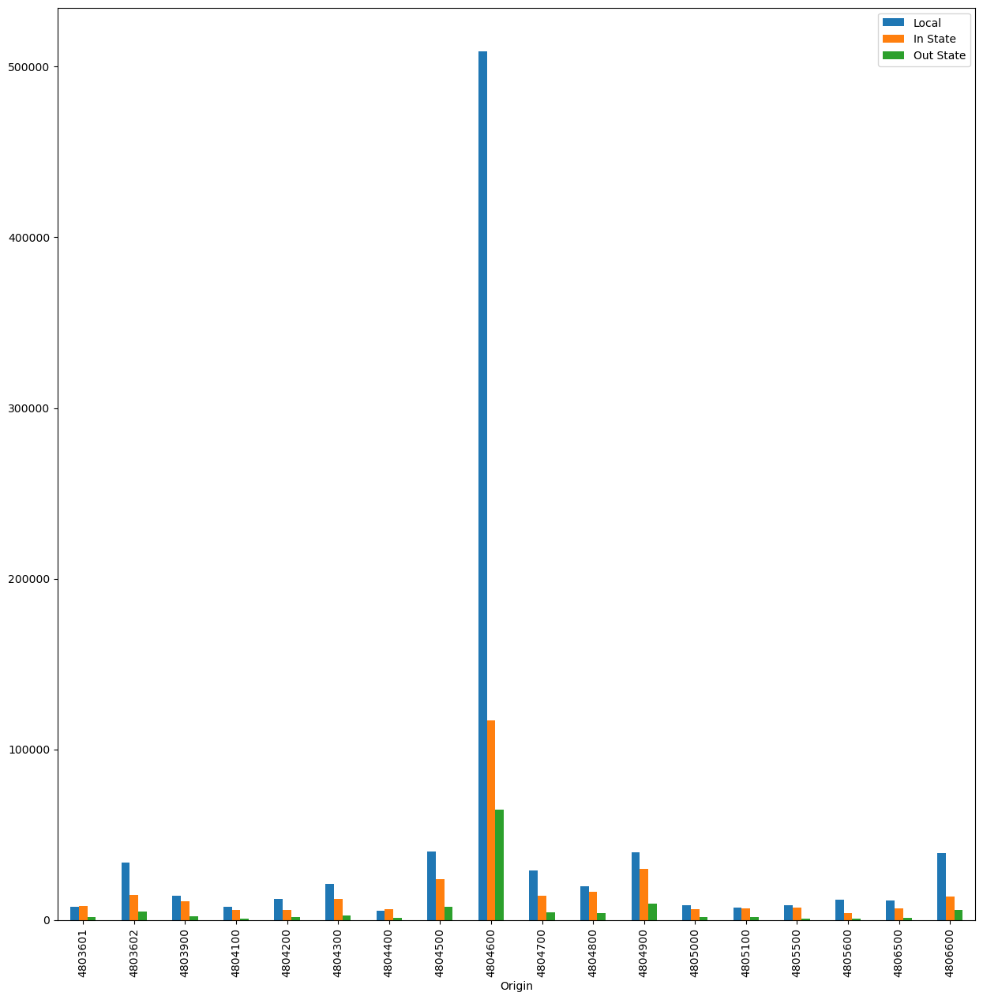

In [31]:
df_mig_o_allyear.plot("Origin",kind="bar")

### I pop out the 4804600 and do the plot again.

<AxesSubplot: xlabel='Origin'>

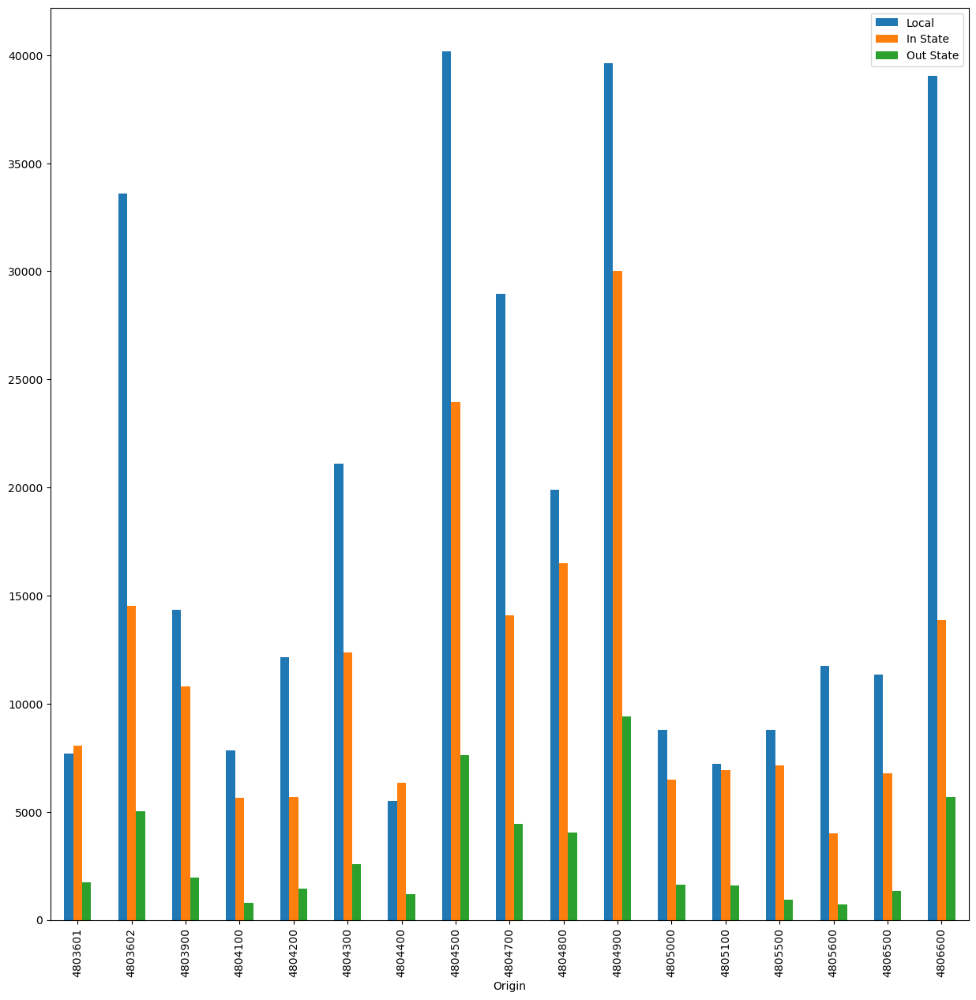

In [30]:
df_mig_o_ex.plot("Origin",kind="bar")

### I calculate the migration status in each year for each migpuma.

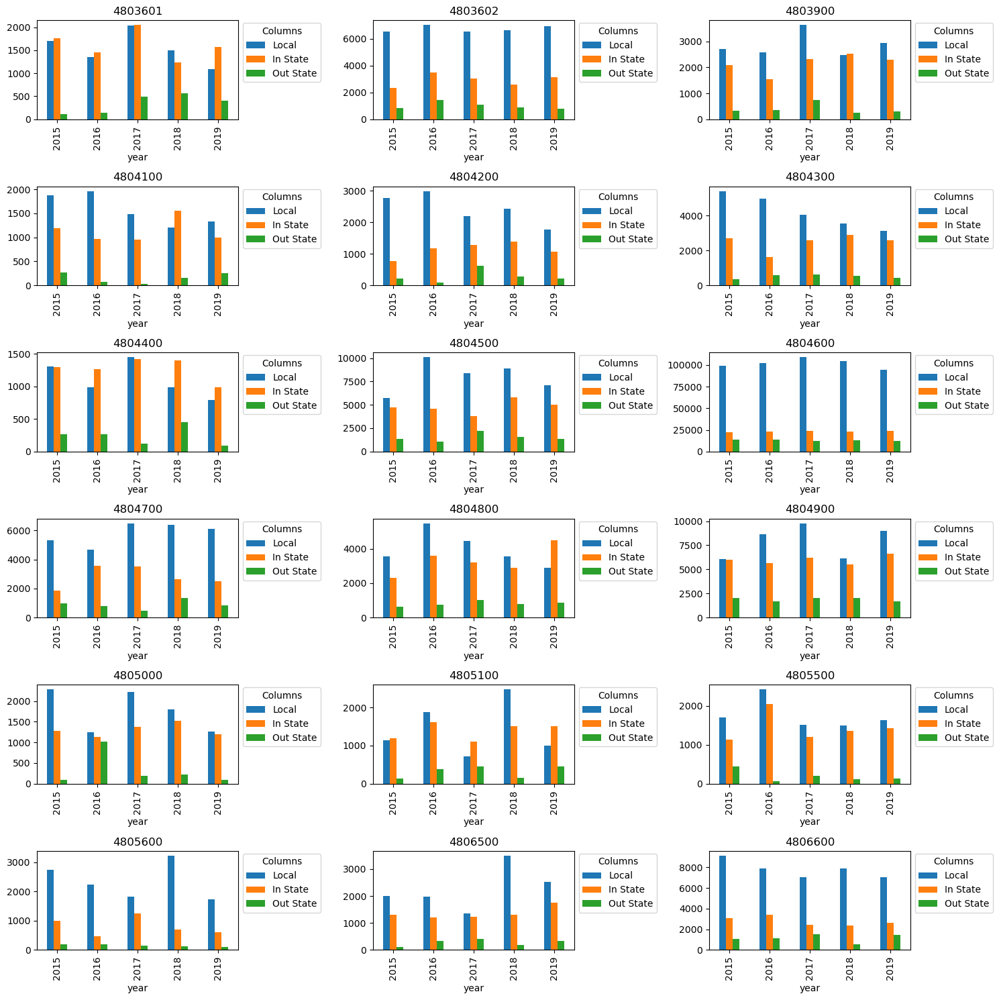

In [44]:
row,col = 6,3
fig = plt.figure()
i=1
for ori in df_mig_o_all.Origin.unique():
    ori = str(ori)
    df = df_mig_o_all[df_mig_o_all["Origin"]==ori]
    local = list(df["Local"])
    In = list(df["In State"])
    n = 5
    r = np.arange(n)
    width = 0.25
    ax = fig.add_subplot(row,col,i)
    df.plot(kind="bar",ax=ax,xlabel="year")
    ax.set_xticks(r,['2015','2016','2017','2018','2019'])
    ax.legend(title='Columns', bbox_to_anchor=(1, 1.02), loc='upper left')
    ax.set_title(ori)
    fig.tight_layout()
    i = i+1

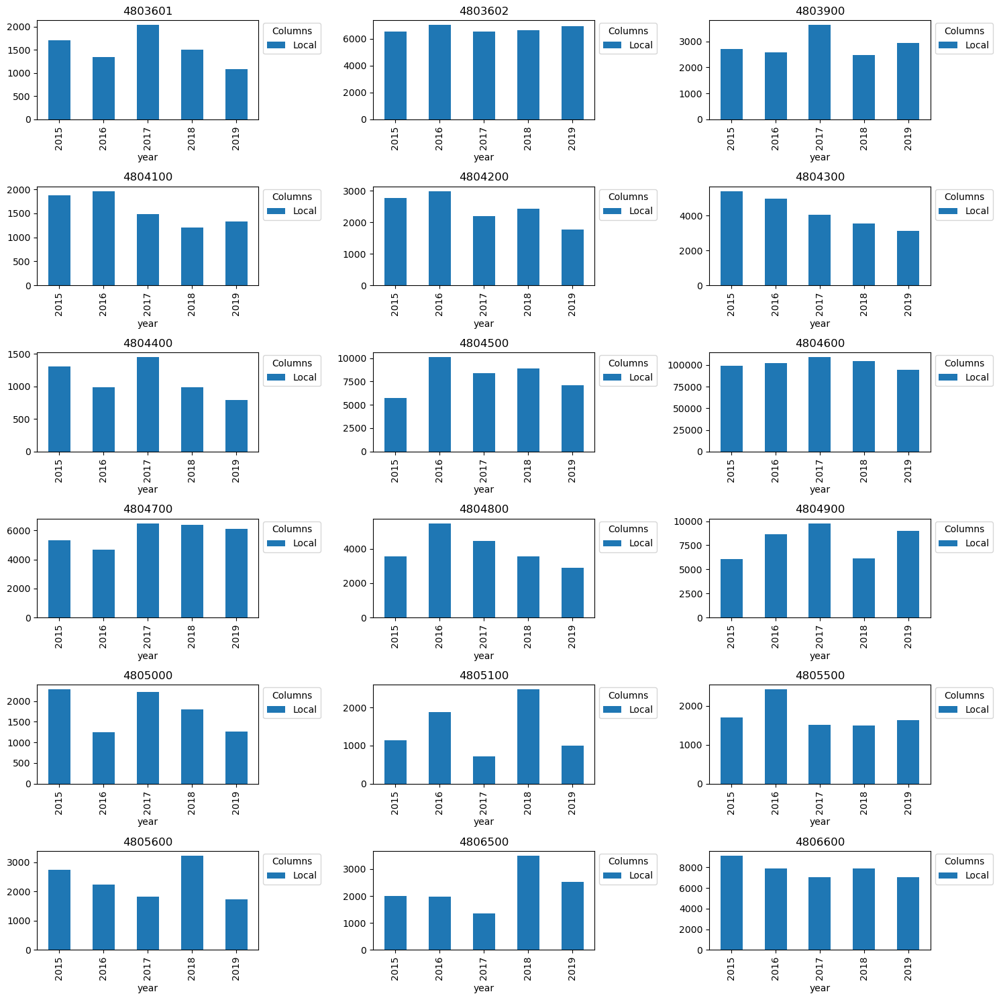

In [43]:
row,col = 6,3
fig = plt.figure()
i=1
for ori in df_mig_o_all.Origin.unique():
    ori = str(ori)
    df = df_mig_o_all[df_mig_o_all["Origin"]==ori]
    df = df[["Origin","year","Local"]]
    n = 5
    r = np.arange(n)
    width = 0.25
    ax = fig.add_subplot(row,col,i)
    df.plot(kind="bar",ax=ax,xlabel="year")
    ax.set_xticks(r,['2015','2016','2017','2018','2019'])
    ax.legend(title='Columns', bbox_to_anchor=(1, 1.02), loc='upper left')
    ax.set_title(ori)
    fig.tight_layout()
    i = i+1

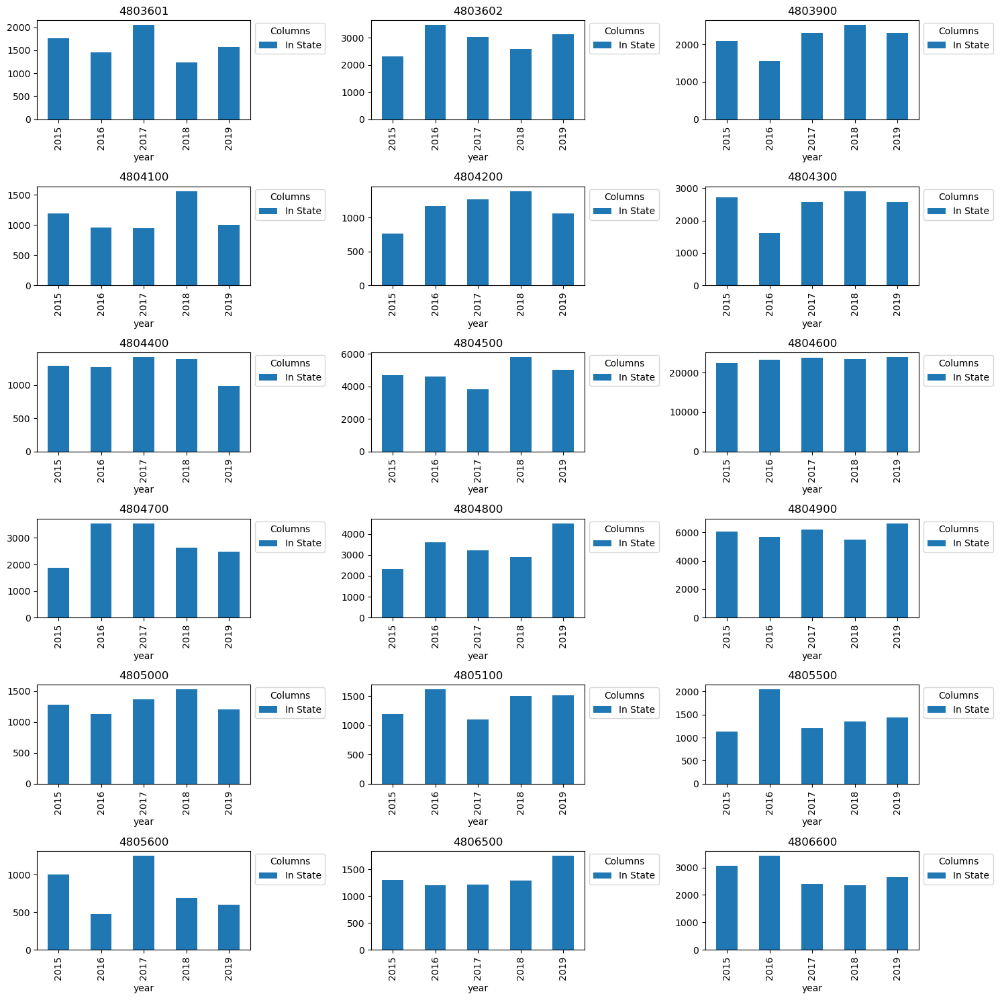

In [45]:
row,col = 6,3
fig = plt.figure()
i=1
for ori in df_mig_o_all.Origin.unique():
    ori = str(ori)
    df = df_mig_o_all[df_mig_o_all["Origin"]==ori]
    df = df[["Origin","year","In State"]]
    n = 5
    r = np.arange(n)
    width = 0.25
    ax = fig.add_subplot(row,col,i)
    df.plot(kind="bar",ax=ax,xlabel="year")
    ax.set_xticks(r,['2015','2016','2017','2018','2019'])
    ax.legend(title='Columns', bbox_to_anchor=(1, 1.02), loc='upper left')
    ax.set_title(ori)
    fig.tight_layout()
    i = i+1

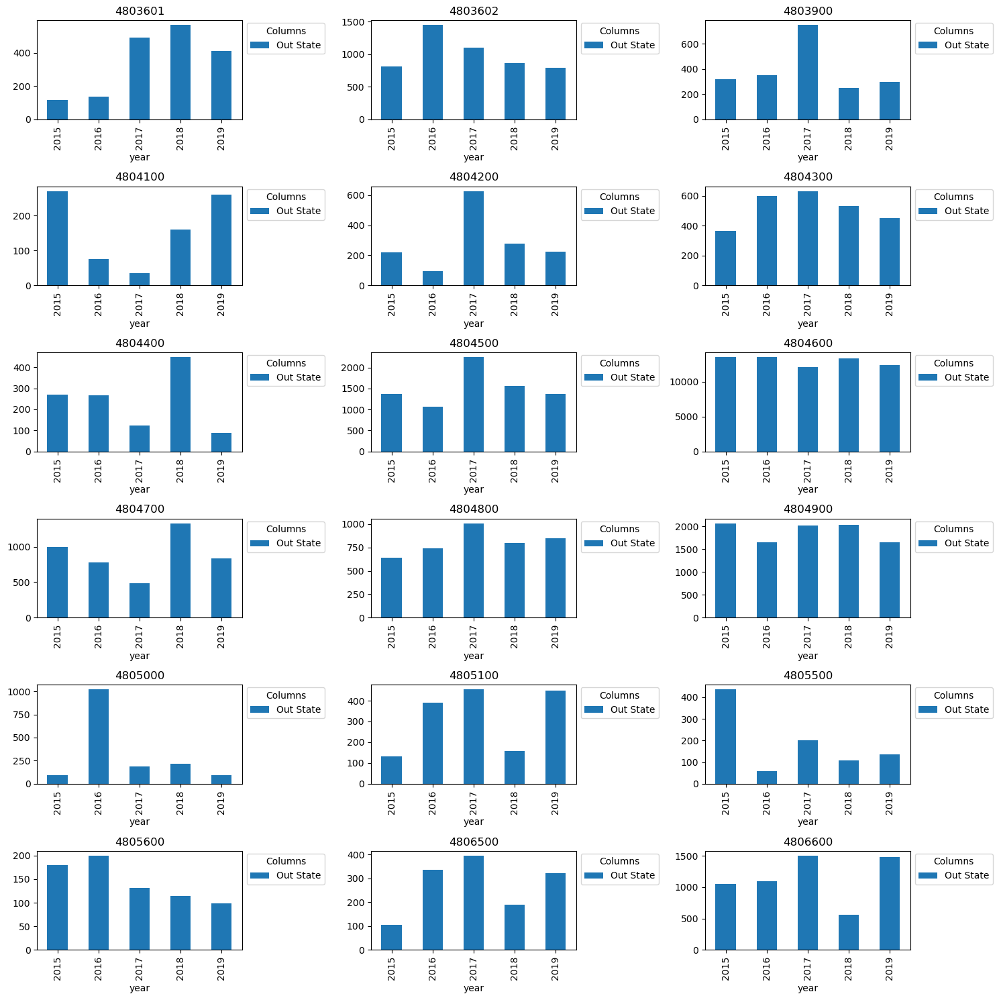

In [46]:
row,col = 6,3
fig = plt.figure()
i=1
for ori in df_mig_o_all.Origin.unique():
    ori = str(ori)
    df = df_mig_o_all[df_mig_o_all["Origin"]==ori]
    df = df[["Origin","year","Out State"]]
    n = 5
    r = np.arange(n)
    width = 0.25
    ax = fig.add_subplot(row,col,i)
    df.plot(kind="bar",ax=ax,xlabel="year")
    ax.set_xticks(r,['2015','2016','2017','2018','2019'])
    ax.legend(title='Columns', bbox_to_anchor=(1, 1.02), loc='upper left')
    ax.set_title(ori)
    fig.tight_layout()
    i = i+1

### I calculate the popular destination and do the ranking plot.

In [169]:
df_order = pd.DataFrame(df_out_state.State.unique())
df_order = df_order.rename(columns={0:"State"})

In [170]:
for year in range(2015,2020):
    year = str(year)
    df = df_out_state[df_out_state["year"]==year]
    df_group = df.groupby(["State"]).agg({"PWGTP":"sum"}).sort_values(by=["PWGTP"],ascending=False).reset_index()
    order_list = [*range(1,len(df_group)+1,1)]
    df_group["Order"] = order_list
    df_group = df_group[df_group["Order"]<=20]
    df_group = df_group.rename(columns={"Order":year}).drop("PWGTP",axis=1)
    df_order = pd.merge(df_order,df_group,left_on="State",right_on="State")


In [171]:
list_plotdata = []
for i in range(len(df_order)):
    list_rank = []
    year_list=[*range(2015,2020)]
    df = df_order[i:i+1]
    name1 = df["State"][i]
    list_rank.append(int(df["2015"]))
    list_rank.append(int(df["2016"]))
    list_rank.append(int(df["2017"]))
    list_rank.append(int(df["2018"]))
    list_rank.append(int(df["2019"]))
    thisdict = dict(Name = [name1 for i in range(5)], Year = year_list, Rank = list_rank)
    list_plotdata.append(thisdict)

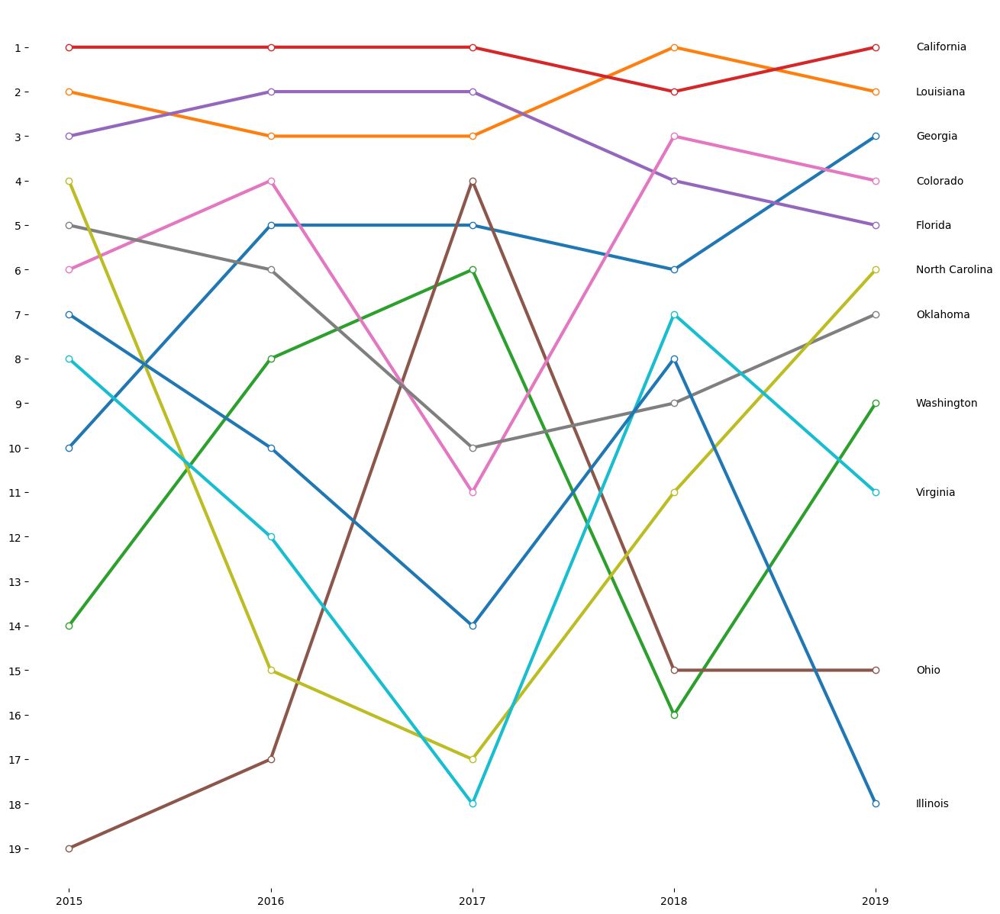

In [207]:
fig, ax = plt.subplots()
for element in list_plotdata:
    ax.plot(element["Year"], 
          element["Rank"], 
          "o-", # format of marker / format of line
          markerfacecolor="white",
          linewidth=3)
    ax.annotate(element["Name"][0], 
              xy=(2019, element["Rank"][4]), 
              xytext=(2019.2,element["Rank"][4]), 
              va="center")
plt.gca().invert_yaxis()
plt.yticks(np.arange(1, 20, 1))
plt.xticks(np.arange(2015, 2020, 1))

for spine in ax.spines.values():
    spine.set_visible(False)

### It's the bar chart for popular destination.

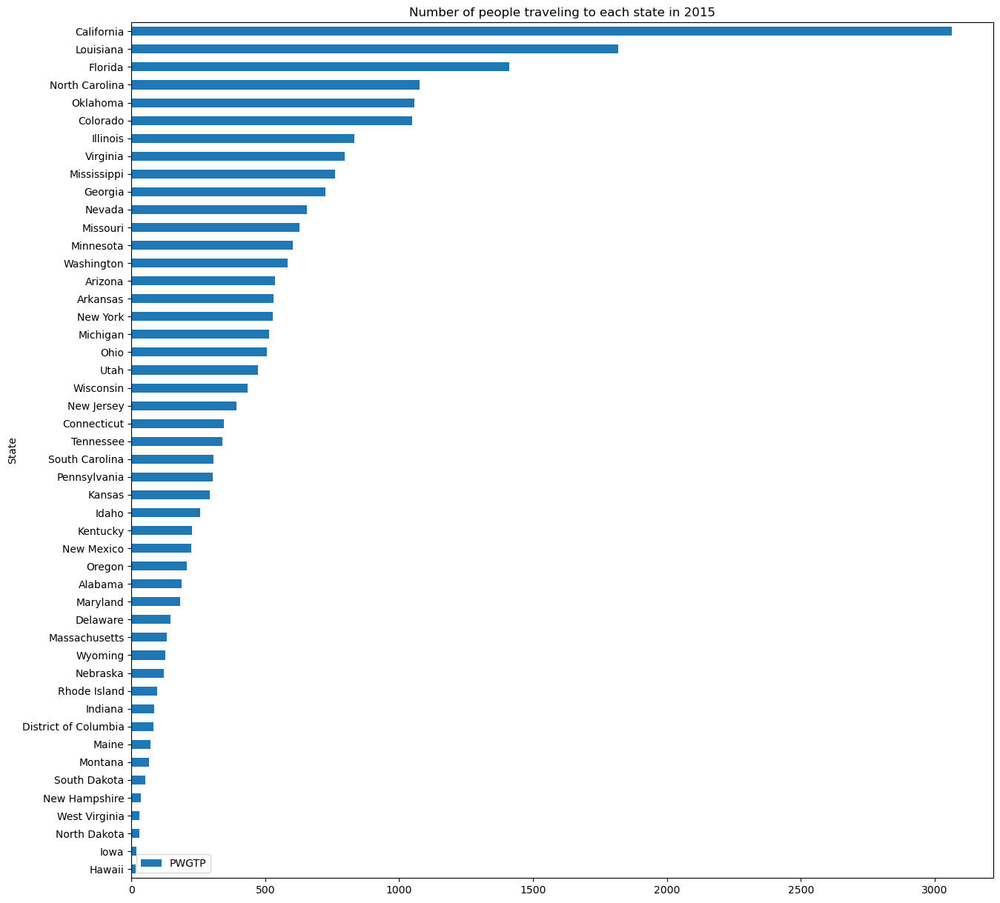

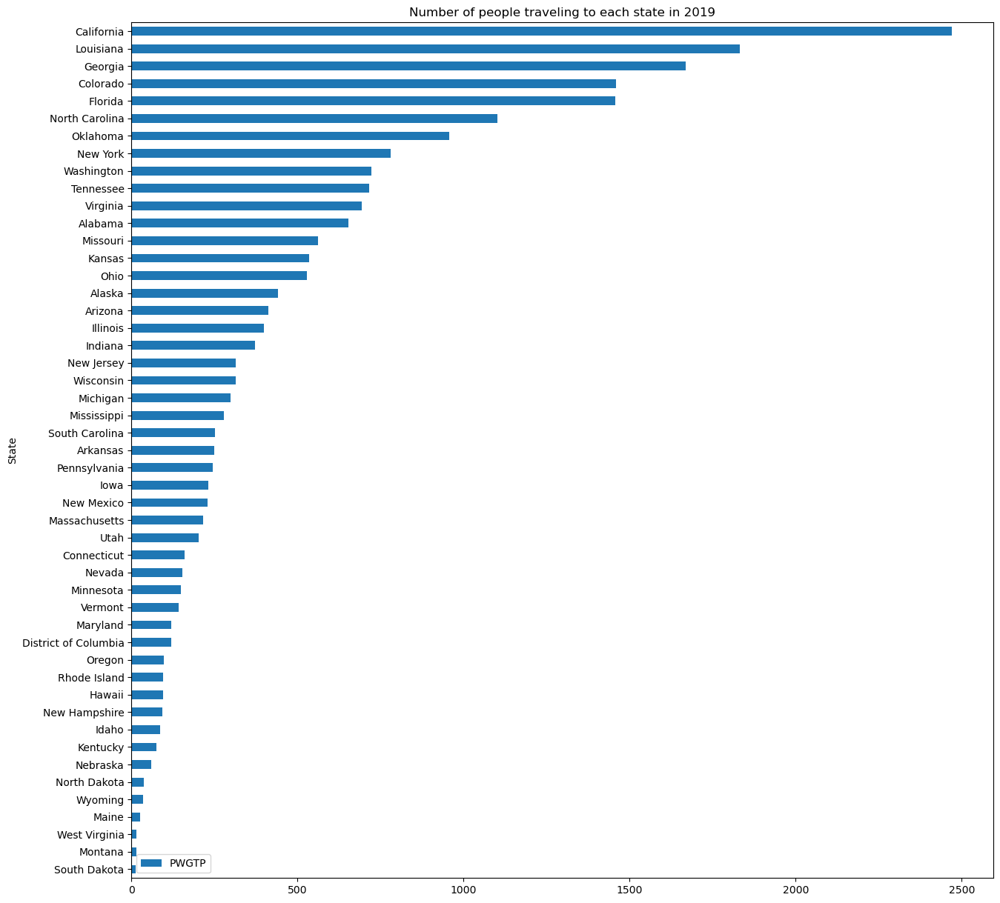

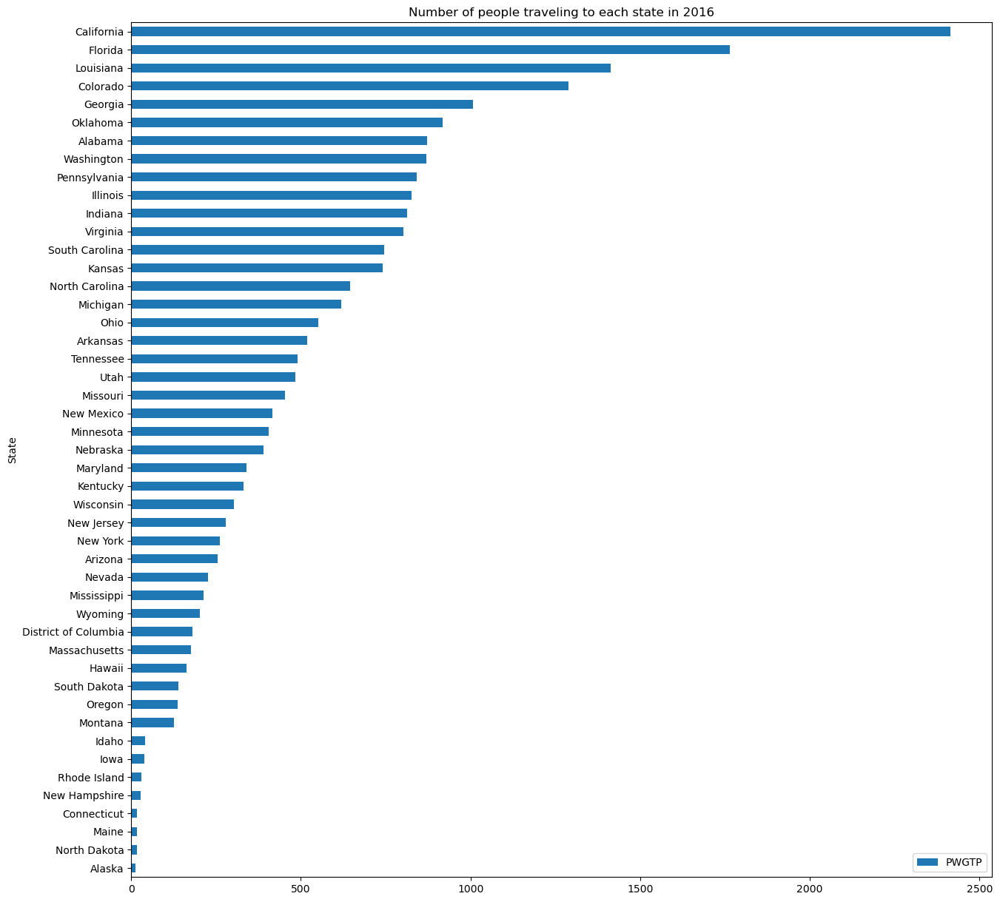

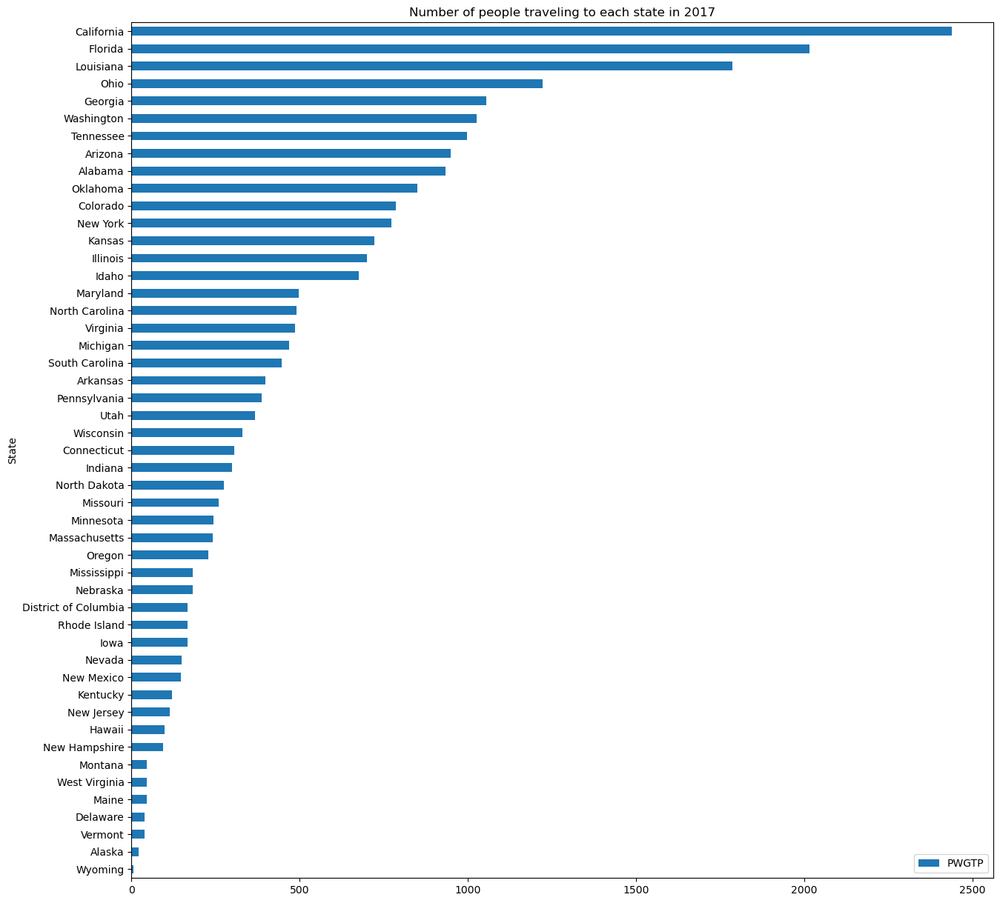

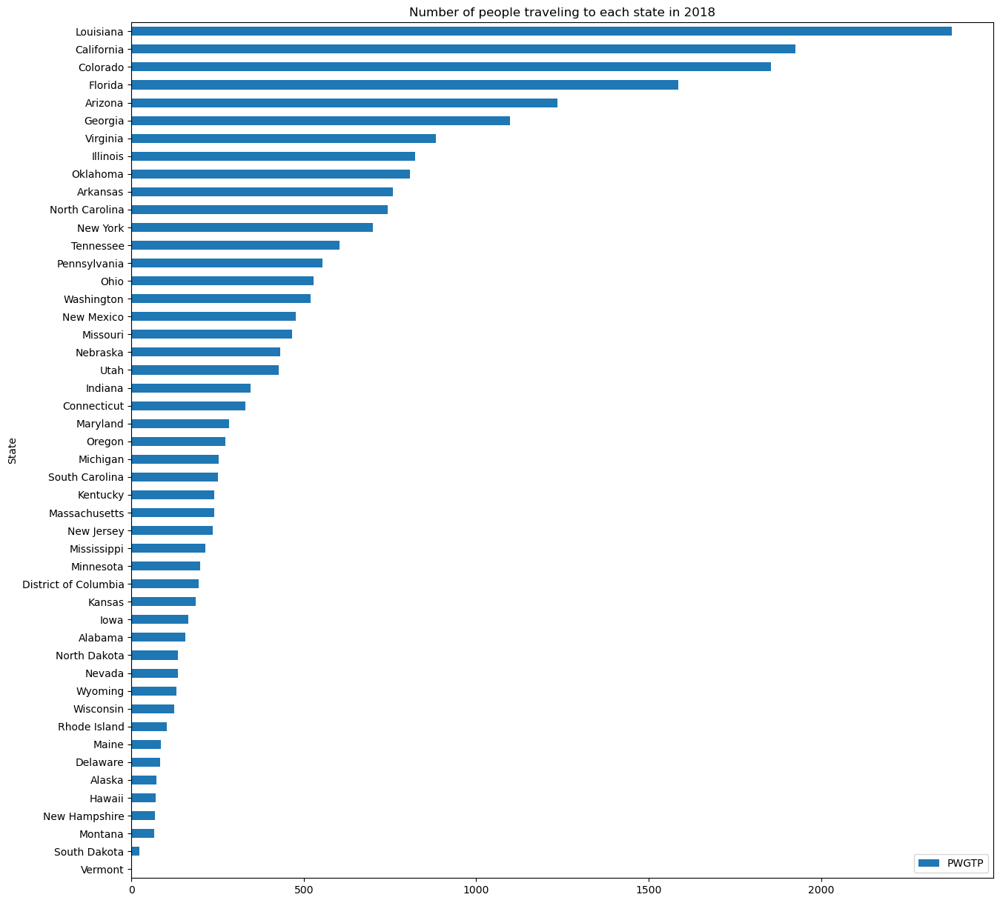

In [34]:
for year in df_out_state.year.unique():
    year = str(year)
    df = df_out_state[df_out_state["year"]==year]
    df_group = df.groupby(["State"]).agg({"PWGTP":"sum"}).sort_values(by=["PWGTP"]).reset_index()
    df_group.plot("State",kind="barh")
    plt.title("Number of people traveling to each state in " + year)
    fig.tight_layout()

FEMA Assistance
Correlation with social variable

In [35]:
for year in df2.year.unique():
    year = str(year)
    df = df2[df2["year"]==year]

### Separate Five Years

Calculate: 
1. Ratio of in-PUMA migrants to all migrants
1. Ratio of migrants to all records

In [77]:
df_2015 = df2[df2["year"]=="2015"]
df_2016 = df2[df2["year"]=="2016"]
df_2017 = df2[df2["year"]=="2017"]
df_2018 = df2[df2["year"]=="2018"]
df_2019 = df2[df2["year"]=="2019"]

In [78]:
def ratio_migrants_year(df):
    inner_migrants = df[df['MIGPUMA_O']==df['MIGPUMA_D']].shape[0]
    total = len(df)
    name_year  = df.year.unique()[0]
    print(name_year)
    print("Ratio of migrants within the same MIGPUMA is %f " % ((inner_migrants)/total)+"in "+ name_year)
    print("Ratio of migratoin is %f" % (len(df)/len(df1)) +" in "+ name_year)

In [79]:
ratio_migrants_year(df_2015)
ratio_migrants_year(df_2016)
ratio_migrants_year(df_2017)
ratio_migrants_year(df_2018)
ratio_migrants_year(df_2019)

2015
Ratio of migrants within the same MIGPUMA is 0.615502 in 2015
Ratio of migratoin is 0.000619 in 2015
2016
Ratio of migrants within the same MIGPUMA is 0.608439 in 2016
Ratio of migratoin is 0.000648 in 2016
2017
Ratio of migrants within the same MIGPUMA is 0.612704 in 2017
Ratio of migratoin is 0.000660 in 2017
2018
Ratio of migrants within the same MIGPUMA is 0.611340 in 2018
Ratio of migratoin is 0.000670 in 2018
2019
Ratio of migrants within the same MIGPUMA is 0.581357 in 2019
Ratio of migratoin is 0.000608 in 2019


### Join Population to MIGPUMA

Add population and land areas of MIGPUMA

In [80]:
# Read the MIGPUMA2000 and MIGPUMA2010 crosswalk table
migpuma_cw_orig = pd.read_csv(table_path+ "Tables-selected/MIGPUMA2000_MIGPUMA2010_crosswalk.csv")
# Remove the column MigPUMA10
migpuma_cw_orig = migpuma_cw_orig.dropna(subset=['MigPUMA10'])

### Read and process the MIGPUMA2000-2010 crosswalk table

Not only for 2000-2010 MigPUMA crosswalk conversion, this table contains population, land areas in 2000 and 2010.

In [81]:
# Read the MIGPUMA2000 and MIGPUMA2010 crosswalk table
migpuma_cw_orig = pd.read_csv(table_path+ "Tables-selected/MIGPUMA2000_MIGPUMA2010_crosswalk.csv")
# Remove rows that has NaN in MigPUMA10
migpuma_cw_orig = migpuma_cw_orig.dropna(subset=['MigPUMA10'])
# Format the MIGPUMA column to a 5-character string
migpuma_cw_orig.loc[:,'MIGPUMA'] = migpuma_cw_orig['MigPUMA10'].astype('int64').astype('str').str.rjust(5, "0")
# Format the MIGSP column (State/County of MigPUMA) to a 2-character string
migpuma_cw_orig.loc[:,'MIGSP'] = migpuma_cw_orig['State10'].astype('int64').astype('str').str.rjust(2, "0")
# Combine MIGSP and MIGPUMA into a single code in order to join tables
migpuma_cw_orig.loc[:,'MIGPUMA2'] = migpuma_cw_orig.loc[:,'MIGSP'] + migpuma_cw_orig.loc[:,'MIGPUMA']
# Select MIGPUMA2 and MigPUMA10_Pop10 from the crosswalk table
migpuma_cw = migpuma_cw_orig[['MIGPUMA2','MigPUMA10_Pop10']].drop_duplicates()
migpuma_cw.to_csv(intermediate_path+'migpuma_cw.csv')

Read shapefiles of PUMA and MIGPUMA 2010

In [82]:
puma = gpd.read_file(GIS_path+'GIS_data/ipums_puma_2010.shp')
migpuma = gpd.read_file(GIS_path+"GIS_data/ipums_migpuma_pwpuma_2010.shp")
puma['PUMA2'] = puma['STATEFIP'] + puma['PUMA']
# combine state code and MIGPUMA code
migpuma['MIGPUMA2'] = migpuma['STATEFIP'] + migpuma['MIGPUMA']

### Aggregation of population flows by origin and destination 

In [83]:
# Population from origins (MIGPUMA)
orig = df2.groupby('MIGPUMA_O').agg(['sum'])['PWGTP'].reset_index().rename(columns={"sum": "person"})

# Population in destination (PUMA)
dest = df2.groupby('PUMA_D').agg(['sum'])['PWGTP'].reset_index().rename(columns={"sum": "person"})

# Population in destination (MIGPUMA)
dest_mig = df2.groupby('MIGPUMA_D').agg(['sum'])['PWGTP'].reset_index().rename(columns={"sum": "person"})

# Population flow from origin to destination (MIGPUMA)
orig_dest = df2.groupby(['MIGPUMA_O','MIGPUMA_D']).agg(['sum'])['PWGTP'].reset_index().rename(columns={"sum": "person"})

C:\Users\xiang11\AppData\Local\Temp\ipykernel_25312\2158777199.py:2: FutureWarning: ['SERIALNO'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.
  orig = df2.groupby('MIGPUMA_O').agg(['sum'])['PWGTP'].reset_index().rename(columns={"sum": "person"})
C:\Users\xiang11\AppData\Local\Temp\ipykernel_25312\2158777199.py:5: FutureWarning: ['SERIALNO'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.
  dest = df2.groupby('PUMA_D').agg(['sum'])['PWGTP'].reset_index().rename(columns={"sum": "person"})
C:\Users\xiang11\AppData\Local\Temp\ipykernel_25312\2158777199.py:8: FutureWarning: ['SERIALNO'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.
  dest_mig = df2.groupby('MIGPUMA_D').agg(['sum'])['PWGTP'].

Join the population to shapefiles of PUMA (destination) and MIGPUMA (origin)

In [84]:
# Join migratnts grouped by origins (out-going migrants) to MIGPUMA polygons
orig = pd.merge(migpuma,orig,how='left',left_on='MIGPUMA2',right_on='MIGPUMA_O')

# Join migratnts grouped by destination (incoming migrants) to PUMA polygons
dest = pd.merge(puma,dest,how='left',left_on='PUMA2',right_on='PUMA_D')

# Join migratnts grouped by destination (incoming migrants) to MIGPUMA polygons
dest_mig = pd.merge(migpuma,dest_mig,how='left',left_on='MIGPUMA2',right_on='MIGPUMA_D')

### Join MIGPUMA population and calculate migrants/population ratio

In [85]:
# Join MIGPUMA polygons to out-going and incoming migrants
orig = pd.merge(orig,migpuma_cw,how='left',left_on='MIGPUMA_O',right_on='MIGPUMA2')
dest_mig = pd.merge(dest_mig,migpuma_cw,how='left',left_on='MIGPUMA_D',right_on='MIGPUMA2')

# converting the population from string to number
orig['MigPUMA10_Pop10'] = pd.to_numeric(orig['MigPUMA10_Pop10'].str.replace(',', ''))
dest_mig['MigPUMA10_Pop10'] = pd.to_numeric(dest_mig['MigPUMA10_Pop10'].str.replace(',', ''))

# Calculate the ratio of population to population in origin and destination
# orig['r_person'] is ratio of migrants moving away from origins to total population in origins
orig['r_person'] = orig['person']/orig['MigPUMA10_Pop10']
# dest_mig['r_person'] is ratio of migrants coming to destinations to total population in destinations
dest_mig['r_person'] = dest_mig['person']/dest_mig['MigPUMA10_Pop10']

### Aggregation of local and out moves at origin and destination 
- Local moves mean that migrants moving within the same MIGPUMA
- Out moves mean that migrants moving from one MIGPUMA to another MIGPUMA

In [86]:
# Select migrants within PUMA and moving out of PUMA
df2_loc = df2[df2['MIGPUMA_O'] == df2['MIGPUMA_D']] # local moves
df2_out = df2[df2['MIGPUMA_O'] != df2['MIGPUMA_D']] # Out moves

# Group the migrants by their origin and destinations (MIGPUMA)
# Group local moves by their destinations (which are also the origins)
dest_loc = df2_loc.groupby('MIGPUMA_D').agg(['sum'])['PWGTP'].reset_index().rename(columns={"sum": "person"})

# Group out moves by their origins and destinations
orig_out = df2_out.groupby('MIGPUMA_O').agg(['sum'])['PWGTP'].reset_index().rename(columns={"sum": "person"})
dest_out = df2_out.groupby('MIGPUMA_D').agg(['sum'])['PWGTP'].reset_index().rename(columns={"sum": "person"})

C:\Users\xiang11\AppData\Local\Temp\ipykernel_25312\3674280785.py:7: FutureWarning: ['SERIALNO'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.
  dest_loc = df2_loc.groupby('MIGPUMA_D').agg(['sum'])['PWGTP'].reset_index().rename(columns={"sum": "person"})
C:\Users\xiang11\AppData\Local\Temp\ipykernel_25312\3674280785.py:10: FutureWarning: ['SERIALNO'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.
  orig_out = df2_out.groupby('MIGPUMA_O').agg(['sum'])['PWGTP'].reset_index().rename(columns={"sum": "person"})
C:\Users\xiang11\AppData\Local\Temp\ipykernel_25312\3674280785.py:11: FutureWarning: ['SERIALNO'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.
  dest_out = df2_out.groupby('MIGPUMA_D

### Join MIGPUMA population and calculate move ratio

In [87]:
# Join population to MIGPUMAs of local and out migrants
dest_loc = pd.merge(dest_loc,migpuma_cw,how='left',left_on='MIGPUMA_D',right_on='MIGPUMA2')
orig_out = pd.merge(orig_out,migpuma_cw,how='left',left_on='MIGPUMA_O',right_on='MIGPUMA2')
dest_out = pd.merge(dest_out,migpuma_cw,how='left',left_on='MIGPUMA_D',right_on='MIGPUMA2')

# Convert the population from string to numbers
dest_loc['MigPUMA10_Pop10'] = pd.to_numeric(dest_loc['MigPUMA10_Pop10'].str.replace(',', ''))
orig_out['MigPUMA10_Pop10'] = pd.to_numeric(orig_out['MigPUMA10_Pop10'].str.replace(',', ''))
dest_out['MigPUMA10_Pop10'] = pd.to_numeric(dest_out['MigPUMA10_Pop10'].str.replace(',', ''))

# Calculate ratio of migrants in origins and destinations
dest_loc['r_person']=dest_loc['person']/dest_loc['MigPUMA10_Pop10'] # Ratio of people moved within the same MIGPUMA
orig_out['r_person']=orig_out['person']/orig_out['MigPUMA10_Pop10'] # Ratio of migrants to the origin population
dest_out['r_person']=dest_out['person']/dest_out['MigPUMA10_Pop10'] # Ratio of migrants to the destination population

Join the migrants, population and migrant ratio to MIGPUMA polygons

In [88]:
dest_loc = pd.merge(migpuma,dest_loc,how='left',left_on='MIGPUMA2',right_on='MIGPUMA_D')
orig_out = pd.merge(migpuma,orig_out,how='left',left_on='MIGPUMA2',right_on='MIGPUMA_O')
dest_out = pd.merge(migpuma,dest_out,how='left',left_on='MIGPUMA2',right_on='MIGPUMA_D')

In [89]:
# Top 5 destinations of out migrants by ratio (r_person)
dest_mig.sort_values(['r_person'],ascending=False).head()

,GISMATCH,STATEFIP,State,MIGPLAC,MIGPUMA,PWSTATE,PWPUMA,geometry,MIGPUMA2_x,MIGPUMA_D,person,MIGPUMA2_y,MigPUMA10_Pop10,r_person
163,4803602,48,Texas,048,03602,48,03602,"POLYGON ((-21525.060 -731702.786, -21476.286 -...",4803602,4803602,43381.0,4803602,194851.0,0.222637
174,4804700,48,Texas,048,04700,48,04700,"MULTIPOLYGON (((85798.152 -938049.531, 85815.3...",4804700,4804700,43784.0,4804700,291309.0,0.150301
173,4804600,48,Texas,048,04600,48,04600,"MULTIPOLYGON (((103465.413 -872421.567, 103475...",4804600,4804600,568481.0,4804600,4092459.0,0.138909
183,4805600,48,Texas,048,05600,48,05600,"MULTIPOLYGON (((-84073.845 -1051465.363, -8406...",4805600,4805600,14251.0,4805600,108174.0,0.131741
172,4804500,48,Texas,048,04500,48,04500,"POLYGON ((80055.990 -798763.072, 80059.765 -79...",4804500,4804500,58902.0,4804500,455746.0,0.129243


In [90]:
# Top 5 destination of local migration by ratio (r_person)
dest_loc.sort_values(['r_person'],ascending=False).head()

,GISMATCH,STATEFIP,State,MIGPLAC,MIGPUMA,PWSTATE,PWPUMA,geometry,MIGPUMA2_x,MIGPUMA_D,person,MIGPUMA2_y,MigPUMA10_Pop10,r_person
163,4803602,48,Texas,048,03602,48,03602,"POLYGON ((-21525.060 -731702.786, -21476.286 -...",4803602,4803602,33591.0,4803602,194851.0,0.172393
173,4804600,48,Texas,048,04600,48,04600,"MULTIPOLYGON (((103465.413 -872421.567, 103475...",4804600,4804600,509200.0,4804600,4092459.0,0.124424
193,4806600,48,Texas,048,06600,48,06600,"MULTIPOLYGON (((-125836.871 -1104782.328, -125...",4806600,4806600,39057.0,4806600,340224.0,0.114798
183,4805600,48,Texas,048,05600,48,05600,"MULTIPOLYGON (((-84073.845 -1051465.363, -8406...",4805600,4805600,11755.0,4805600,108174.0,0.108668
174,4804700,48,Texas,048,04700,48,04700,"MULTIPOLYGON (((85798.152 -938049.531, 85815.3...",4804700,4804700,28976.0,4804700,291309.0,0.099468


### Do the same process for each year during 2015 and 2019

### Add affected countie

In [91]:
df_af_county = gpd.read_file(GIS_path+"affectedarea/affect_county.shp").to_crs("ESRI:102003")

In [92]:
df_af_county["NEW_NAME"] = df_af_county["NAME"].apply(lambda x: x[:-6])

In [119]:
def ori(df):
    # Population from origins (MIGPUMA)
    orig = df.groupby('MIGPUMA_O').agg(['sum'])['PWGTP'].reset_index().rename(columns={"sum": "person"})
    
    orig = pd.merge(migpuma,orig,how='left',left_on='MIGPUMA2',right_on='MIGPUMA_O')
    
    orig = pd.merge(orig,migpuma_cw,how='left',left_on='MIGPUMA_O',right_on='MIGPUMA2')
    
    orig['MigPUMA10_Pop10'] = pd.to_numeric(orig['MigPUMA10_Pop10'].str.replace(',', ''))
    
    orig['r_person'] = orig['person']/orig['MigPUMA10_Pop10']
    fig, ax = plt.subplots()
    orig.plot(column='r_person',scheme='UserDefined',
         classification_kwds={'bins':[ 0.010,  0.020,  0.030,  0.040,  0.050,  0.060]},
         cmap='coolwarm',
         linewidth=5,
         legend=True,
             ax=ax)
    df_migpuma.boundary.plot(color="blue",ax=ax)
#     df_migpuma.apply(lambda x: ax.annotate(text=x['MIGPUMA2'], xy=x.geometry.centroid.coords[0], ha='center'), axis=1)
    df_af_county.boundary.plot(linestyle='dashed',color="grey",ax=ax)
    df_af_county.apply(lambda x: ax.annotate(text=x['NEW_NAME'], xy=x.geometry.centroid.coords[0], ha='center'), axis=1)
    cx.add_basemap(ax=ax,source=cx.providers.CartoDB.Voyager,crs=df_af_county.crs)
    name_year  = df.year.unique()[0]
    plt.title('Origin (MIGPUMA) of all moves (colored by population) in '+name_year)

C:\Users\xiang11\AppData\Local\Temp\ipykernel_25312\2058181186.py:3: FutureWarning: ['SERIALNO'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.
  orig = df.groupby('MIGPUMA_O').agg(['sum'])['PWGTP'].reset_index().rename(columns={"sum": "person"})
C:\Users\xiang11\AppData\Local\Temp\ipykernel_25312\2058181186.py:3: FutureWarning: ['SERIALNO'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.
  orig = df.groupby('MIGPUMA_O').agg(['sum'])['PWGTP'].reset_index().rename(columns={"sum": "person"})


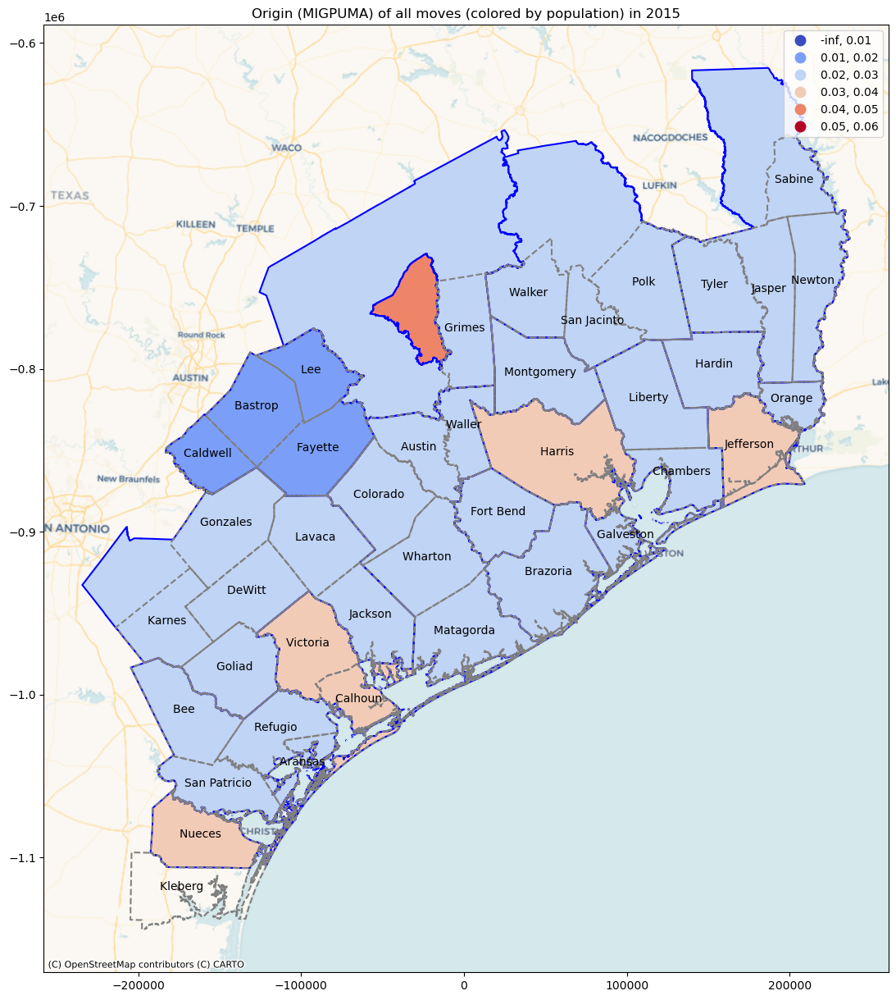

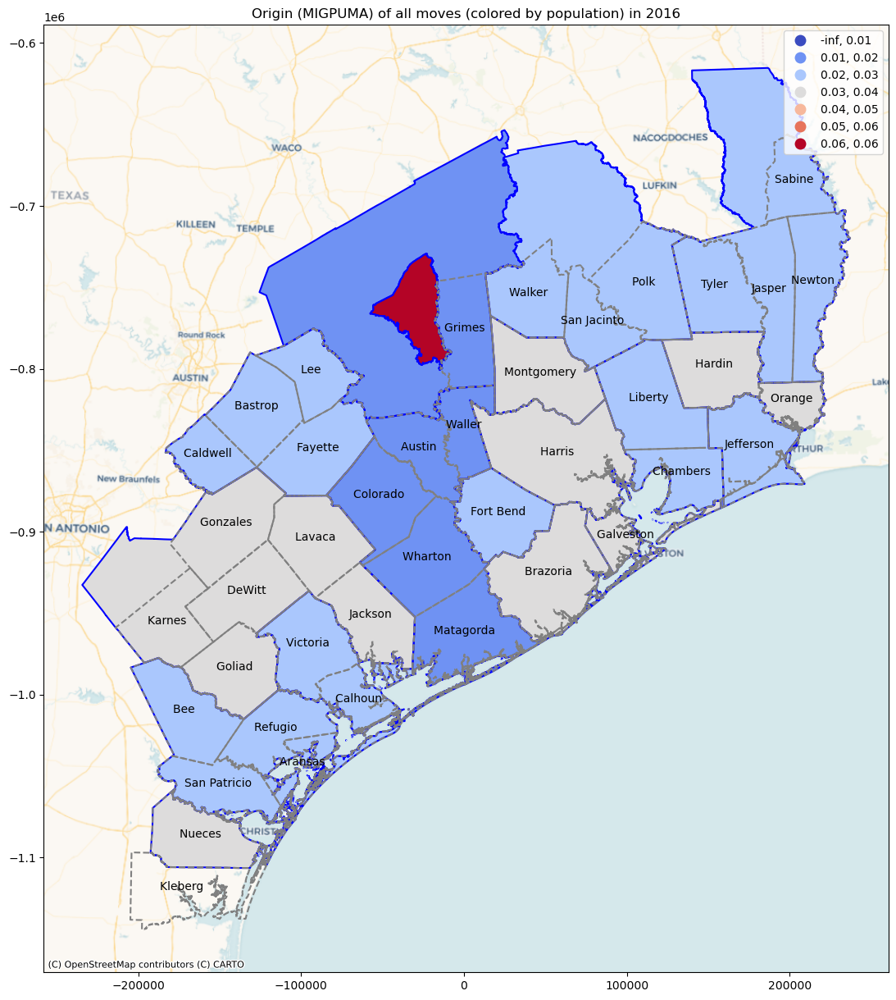

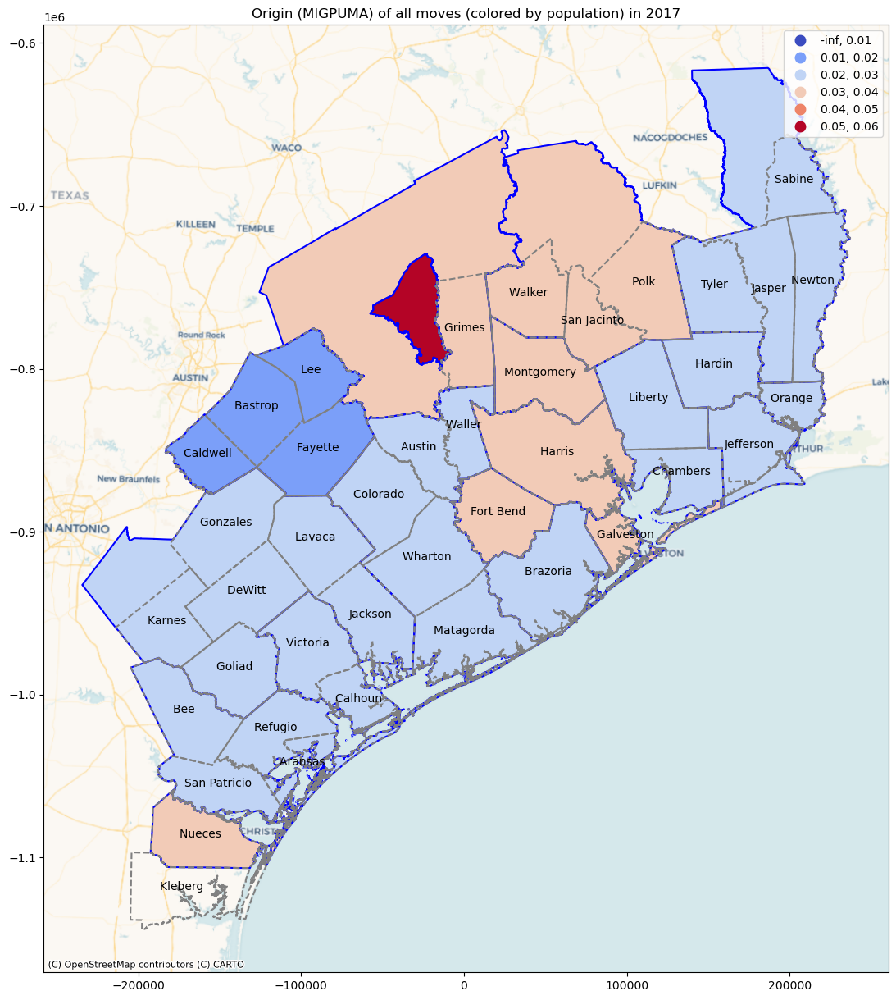

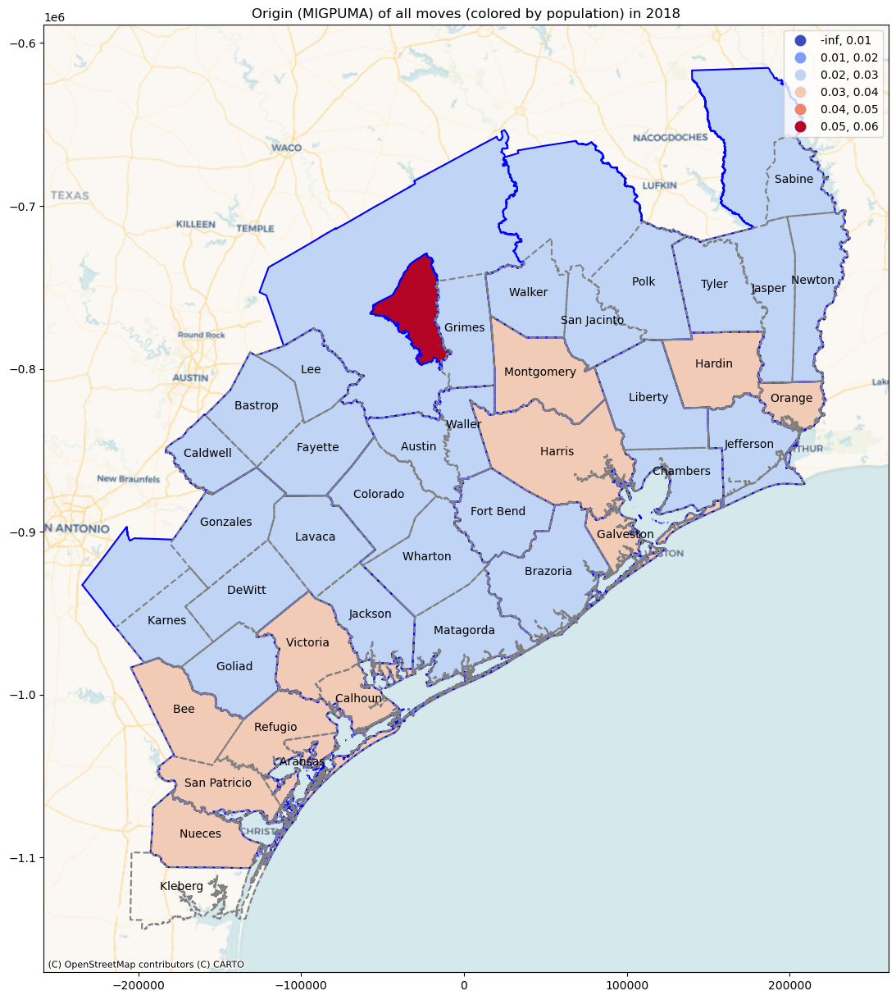

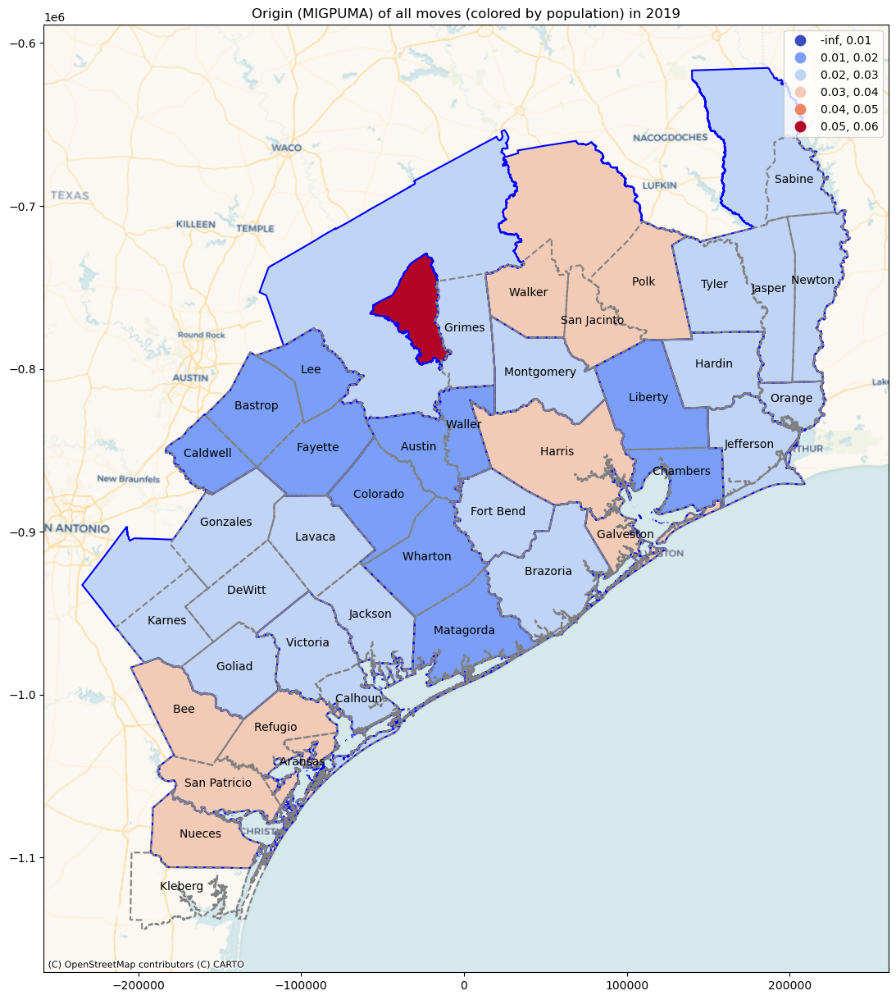

In [120]:
ori(df_2015)
ori(df_2016)
ori(df_2017)
ori(df_2018)
ori(df_2019)

In [95]:
def dest(df):
    # Population in destination (PUMA)
    dest = df.groupby('PUMA_D').agg(['sum'])['PWGTP'].reset_index().rename(columns={"sum": "person"})
    
    dest = pd.merge(puma,dest,how='left',left_on='PUMA2',right_on='PUMA_D')
    name_year  = df.year.unique()[0]
    fig, ax = plt.subplots()
    dest.plot(column='person',scheme='FisherJenks',
         categorical=False,
         cmap='RdBu_r',
         linewidth=5,
         legend=True,
         ax=ax)
#     df_af_county.boundary.plot(linestyle='dashed',color="grey",ax=ax)
#     cx.add_basemap(ax=ax,source=cx.providers.CartoDB.Voyager,crs=df_af_county.crs)
#     df_af_county.apply(lambda x: ax.annotate(text=x['NEW_NAME'], xy=x.geometry.centroid.coords[0], ha='center'), axis=1)
    plt.title('Destinations (PUMA) of all moves (colored by population) in '+name_year)

C:\Users\xiang11\AppData\Local\Temp\ipykernel_25312\1768442435.py:3: FutureWarning: ['SERIALNO'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.
  dest = df.groupby('PUMA_D').agg(['sum'])['PWGTP'].reset_index().rename(columns={"sum": "person"})
C:\Users\xiang11\AppData\Local\Temp\ipykernel_25312\1768442435.py:3: FutureWarning: ['SERIALNO'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.
  dest = df.groupby('PUMA_D').agg(['sum'])['PWGTP'].reset_index().rename(columns={"sum": "person"})


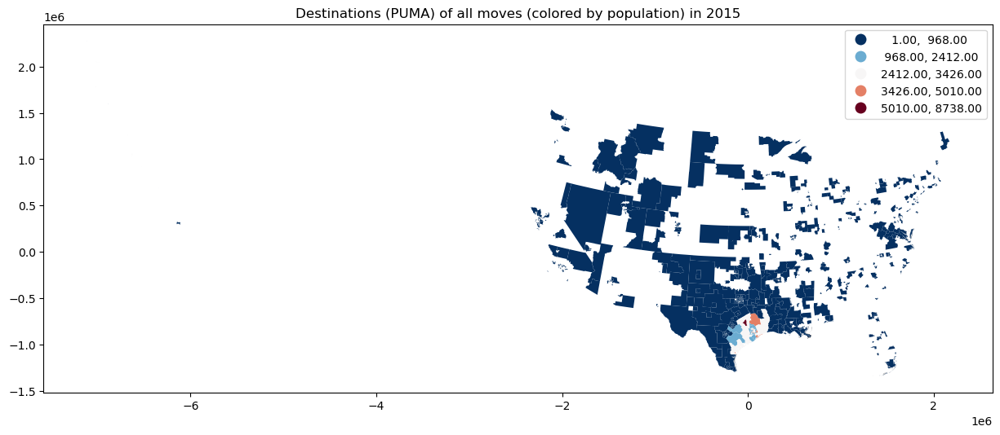

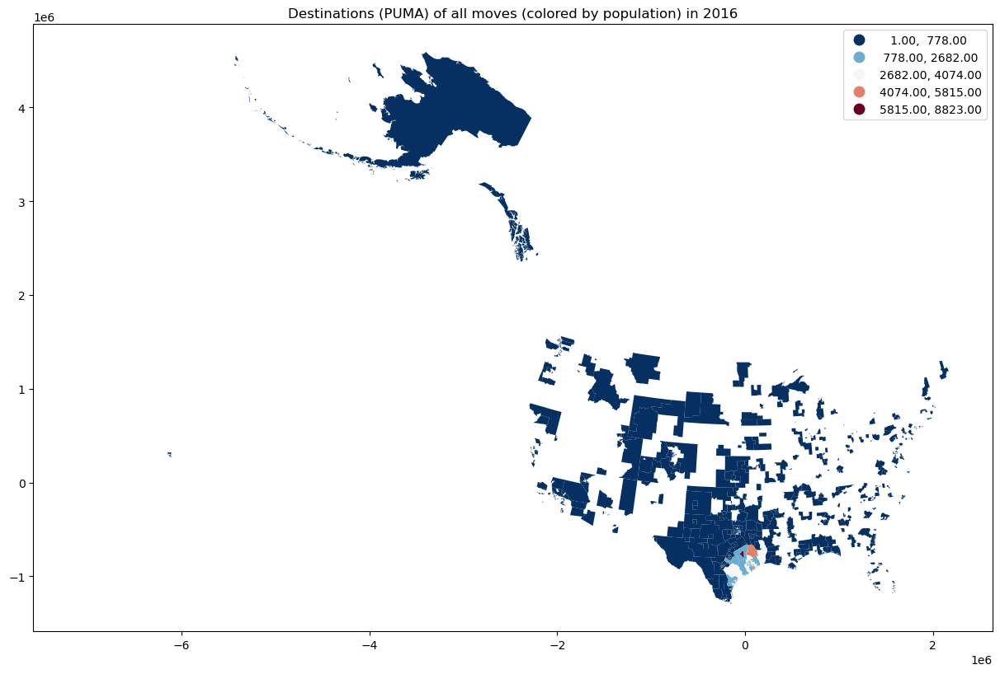

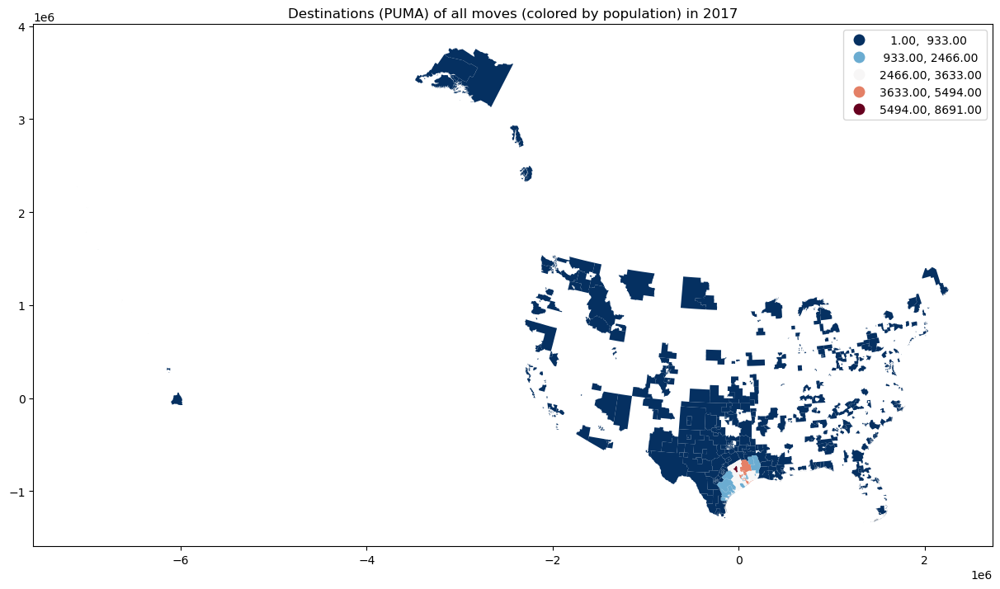

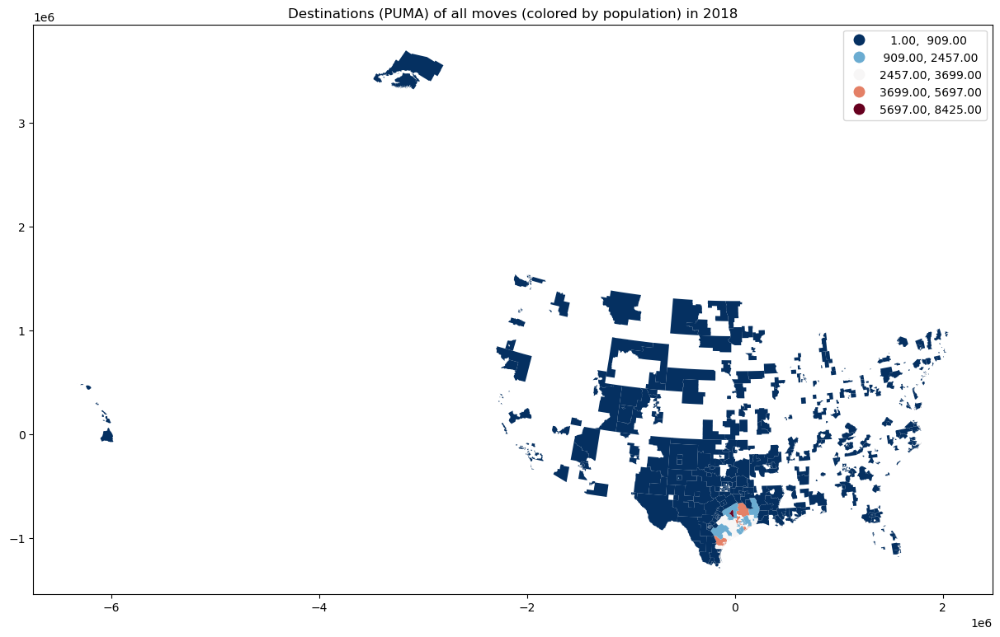

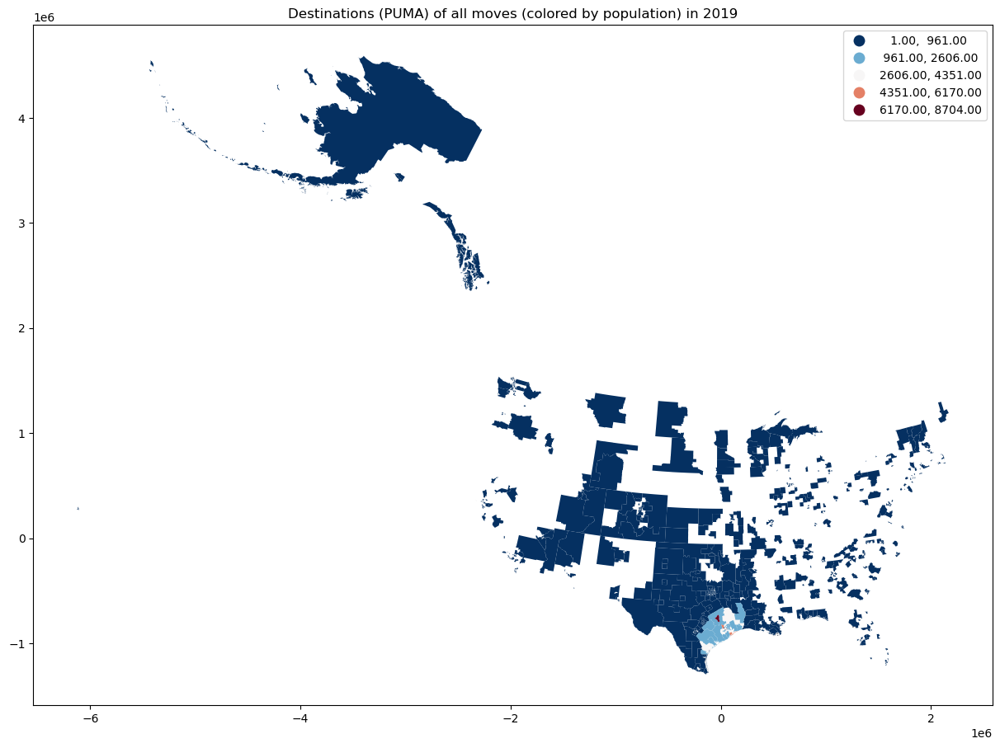

In [96]:
dest(df_2015)
dest(df_2016)
dest(df_2017)
dest(df_2018)
dest(df_2019)

In [97]:
def dest_mig(df):
    # Population in destination (MIGPUMA)
    dest_mig = df.groupby('MIGPUMA_D').agg(['sum'])['PWGTP'].reset_index().rename(columns={"sum": "person"})
    
    # Join migratnts grouped by destination (incoming migrants) to MIGPUMA polygons
    dest_mig = pd.merge(migpuma,dest_mig,how='left',left_on='MIGPUMA2',right_on='MIGPUMA_D')       
    
    dest_mig = pd.merge(dest_mig,migpuma_cw,how='left',left_on='MIGPUMA_D',right_on='MIGPUMA2')

    dest_mig['MigPUMA10_Pop10'] = pd.to_numeric(dest_mig['MigPUMA10_Pop10'].str.replace(',', ''))

    # dest_mig['r_person'] is ratio of migrants coming to destinations to total population in destinations
    dest_mig['r_person'] = dest_mig['person']/dest_mig['MigPUMA10_Pop10']
    dest_mig.plot(column='r_person',scheme='FisherJenks',
         categorical=False,
         cmap='RdBu_r',
         linewidth=5,
         legend=True)
    name_year  = df.year.unique()[0]
    plt.title('Destinations (MigPUMA) of all moves (colored by population) in '+name_year)

C:\Users\xiang11\AppData\Local\Temp\ipykernel_25312\3958791403.py:3: FutureWarning: ['SERIALNO'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.
  dest_mig = df.groupby('MIGPUMA_D').agg(['sum'])['PWGTP'].reset_index().rename(columns={"sum": "person"})
C:\Users\xiang11\AppData\Local\Temp\ipykernel_25312\3958791403.py:3: FutureWarning: ['SERIALNO'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.
  dest_mig = df.groupby('MIGPUMA_D').agg(['sum'])['PWGTP'].reset_index().rename(columns={"sum": "person"})


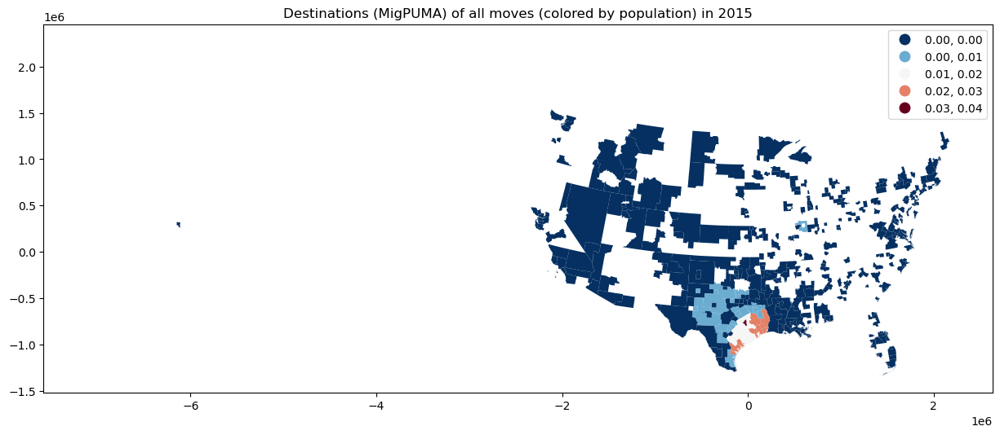

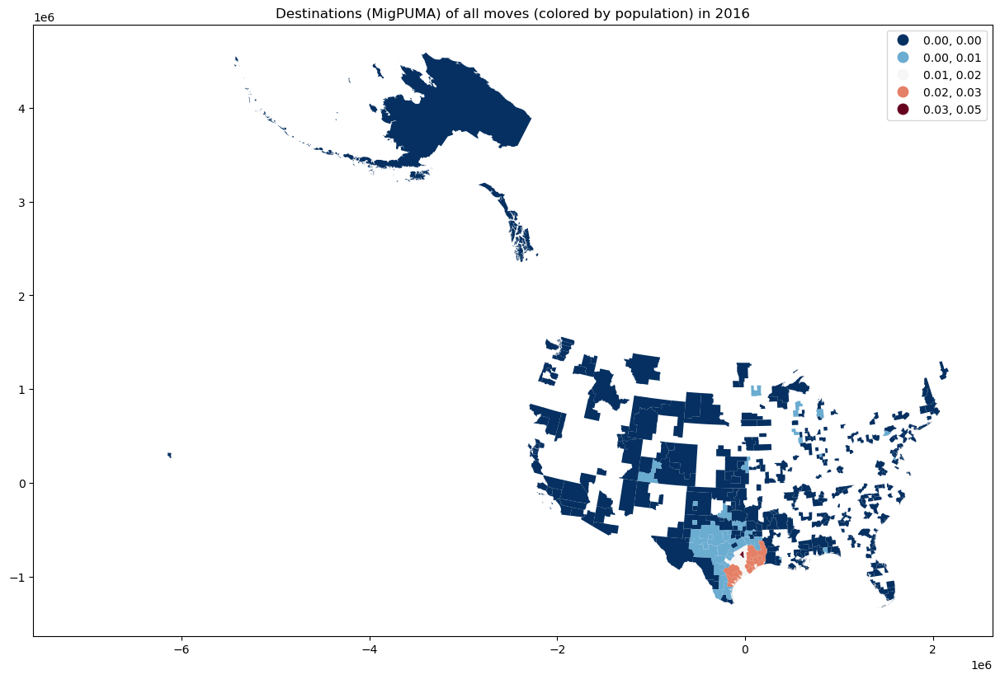

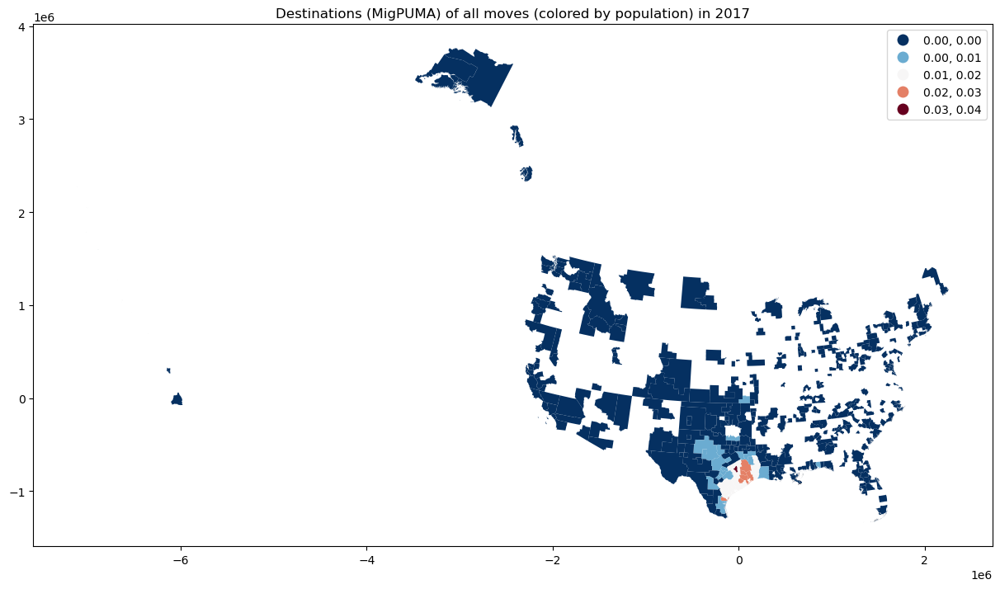

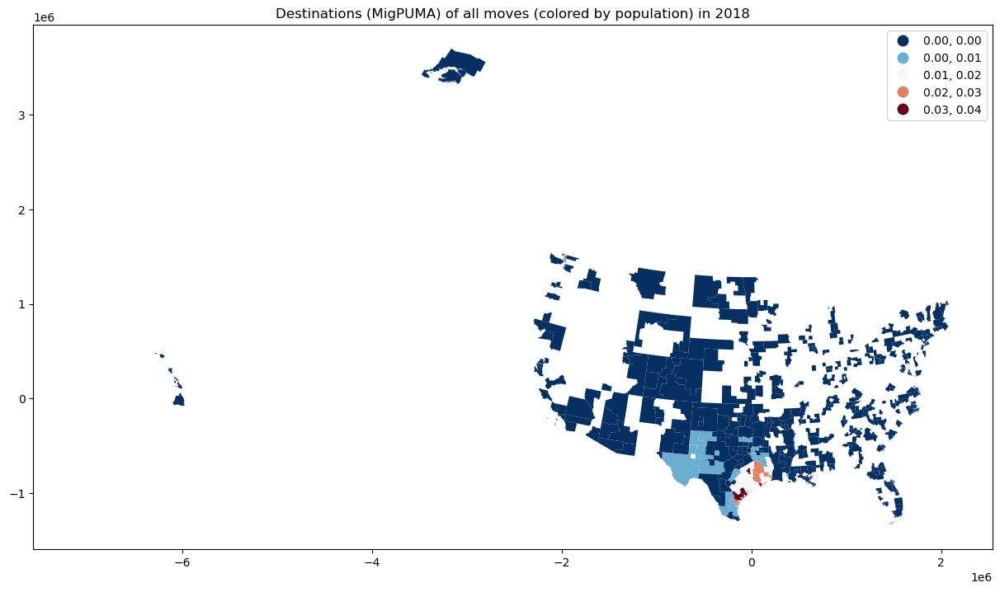

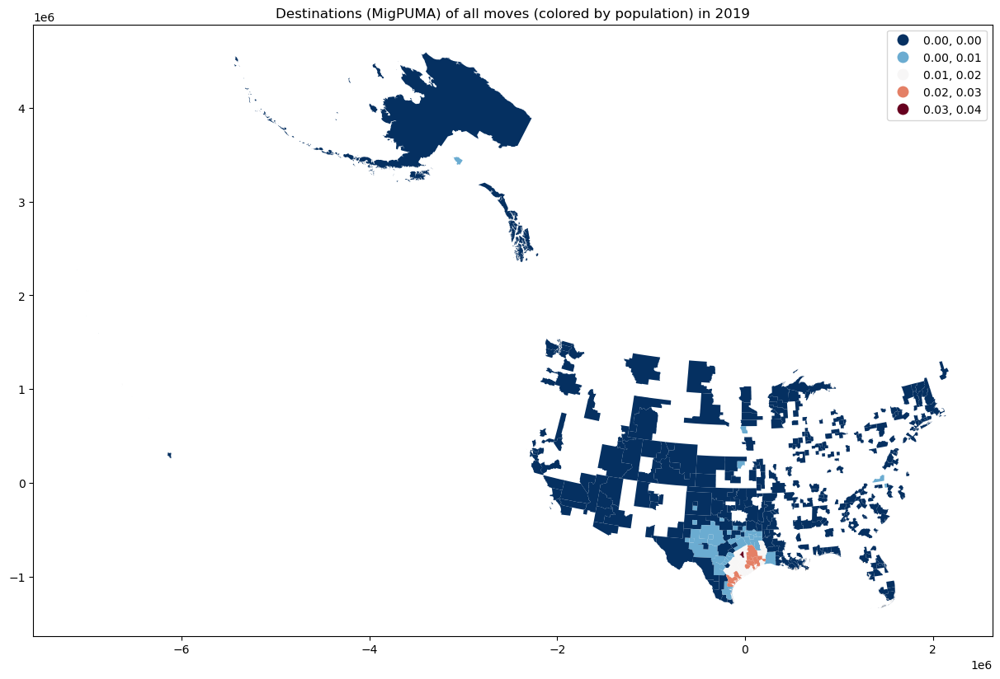

In [98]:
dest_mig(df_2015)
dest_mig(df_2016)
dest_mig(df_2017)
dest_mig(df_2018)
dest_mig(df_2019)

In [121]:
def dest_loc(df):
    # Select migrants within PUMA and moving out of PUMA
    df2_loc = df[df['MIGPUMA_O'] == df['MIGPUMA_D']] # local moves
    df2_out = df[df['MIGPUMA_O'] != df['MIGPUMA_D']] # Out moves

    # Group the migrants by their origin and destinations (MIGPUMA)
    # Group local moves by their destinations (which are also the origins)
    dest_loc = df2_loc.groupby('MIGPUMA_D').agg(['sum'])['PWGTP'].reset_index().rename(columns={"sum": "person"})

    # Join population to MIGPUMAs of local and out migrants
    dest_loc = pd.merge(dest_loc,migpuma_cw,how='left',left_on='MIGPUMA_D',right_on='MIGPUMA2')

    # Convert the population from string to numbers
    dest_loc['MigPUMA10_Pop10'] = pd.to_numeric(dest_loc['MigPUMA10_Pop10'].str.replace(',', ''))

    # Calculate ratio of migrants in origins and destinations
    dest_loc['r_person']=dest_loc['person']/dest_loc['MigPUMA10_Pop10'] # Ratio of people moved within the same MIGPUMA
    
    dest_loc = pd.merge(migpuma,dest_loc,how='left',left_on='MIGPUMA2',right_on='MIGPUMA_D')

    fig, ax = plt.subplots()
    dest_loc.plot(column='r_person',scheme='UserDefined',
         classification_kwds={'bins':[ 0.005, 0.010, 0.015, 0.020, 0.025, 0.030, 0.035, 0.040]},
         categorical=False,
         cmap='coolwarm',
         linewidth=5,
         legend=True,
         ax=ax)

    df_migpuma.boundary.plot(color="blue",ax=ax)
#     df_migpuma.apply(lambda x: ax.annotate(text=x['MIGPUMA2'], xy=x.geometry.centroid.coords[0], ha='center'), axis=1)
    df_af_county.boundary.plot(linestyle='dashed',color="grey",ax=ax)
    df_af_county.apply(lambda x: ax.annotate(text=x['NEW_NAME'], xy=x.geometry.centroid.coords[0], ha='center'), axis=1)
    cx.add_basemap(ax=ax,source=cx.providers.CartoDB.Voyager,crs=df_af_county.crs)
    name_year  = df.year.unique()[0]
    plt.title('Destination (MIGPUMA) of all local migrants (Outmovers) moves (colored by population) in '+name_year)

C:\Users\xiang11\AppData\Local\Temp\ipykernel_25312\1383098282.py:8: FutureWarning: ['SERIALNO'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.
  dest_loc = df2_loc.groupby('MIGPUMA_D').agg(['sum'])['PWGTP'].reset_index().rename(columns={"sum": "person"})
C:\Users\xiang11\AppData\Local\Temp\ipykernel_25312\1383098282.py:8: FutureWarning: ['SERIALNO'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.
  dest_loc = df2_loc.groupby('MIGPUMA_D').agg(['sum'])['PWGTP'].reset_index().rename(columns={"sum": "person"})


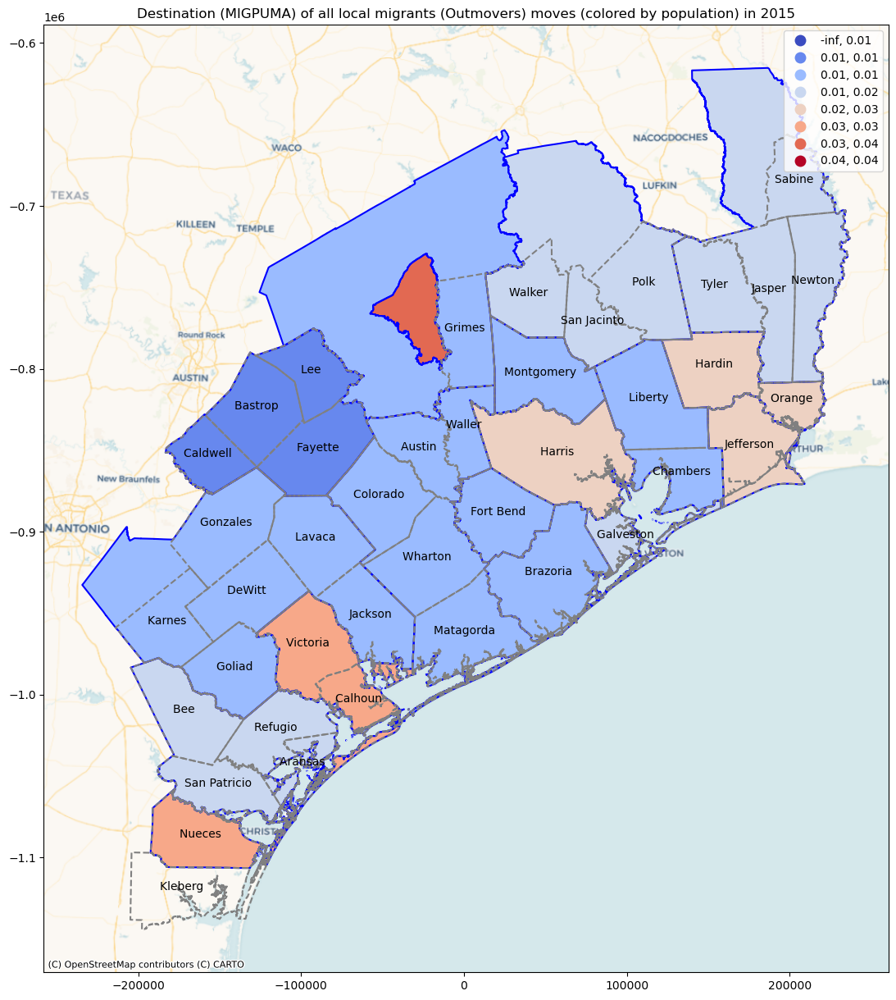

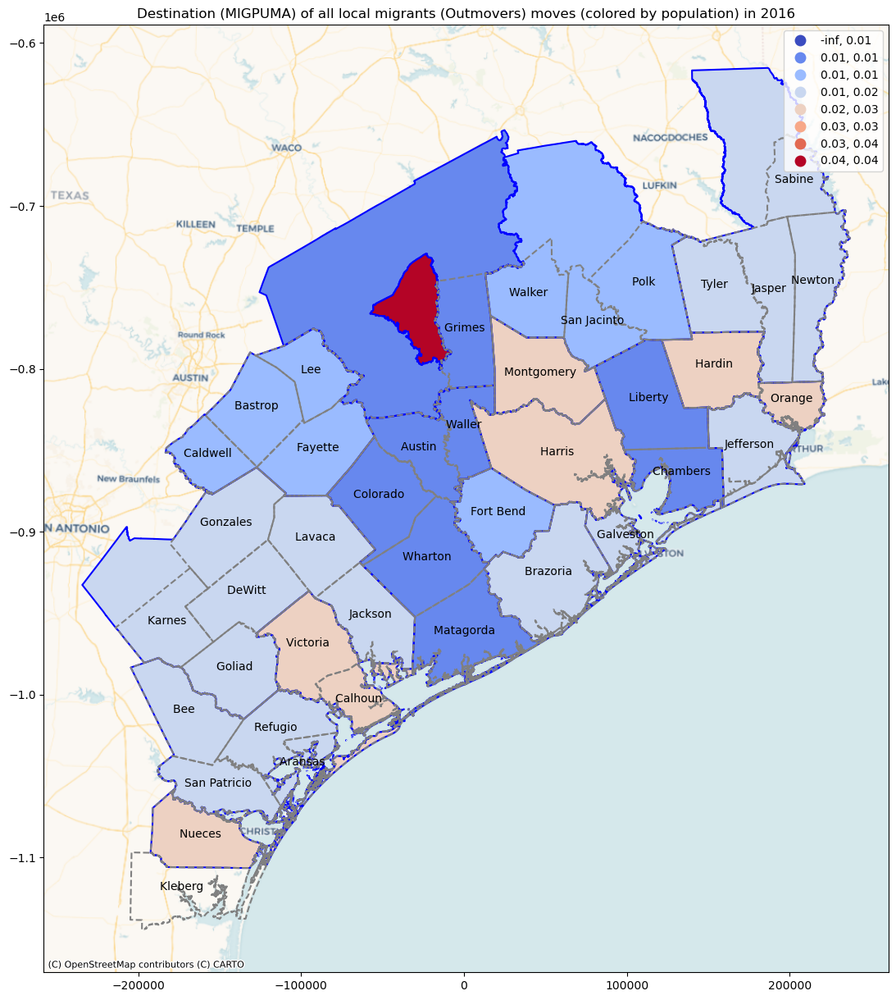

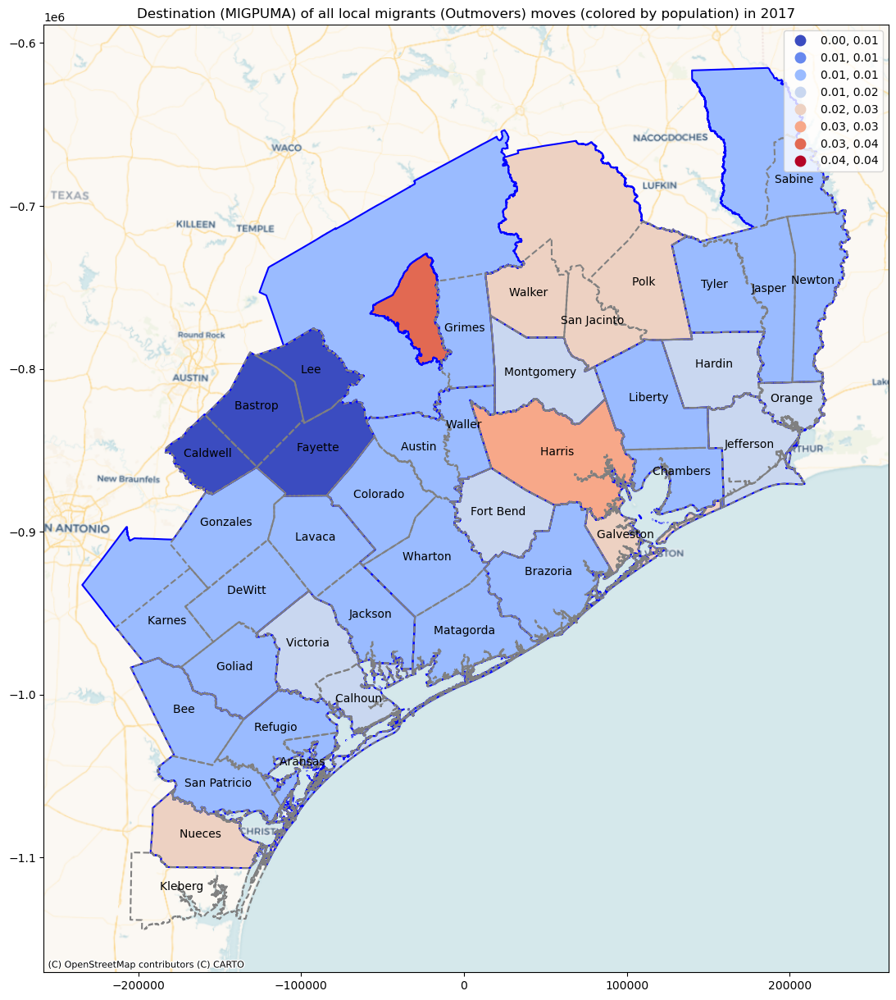

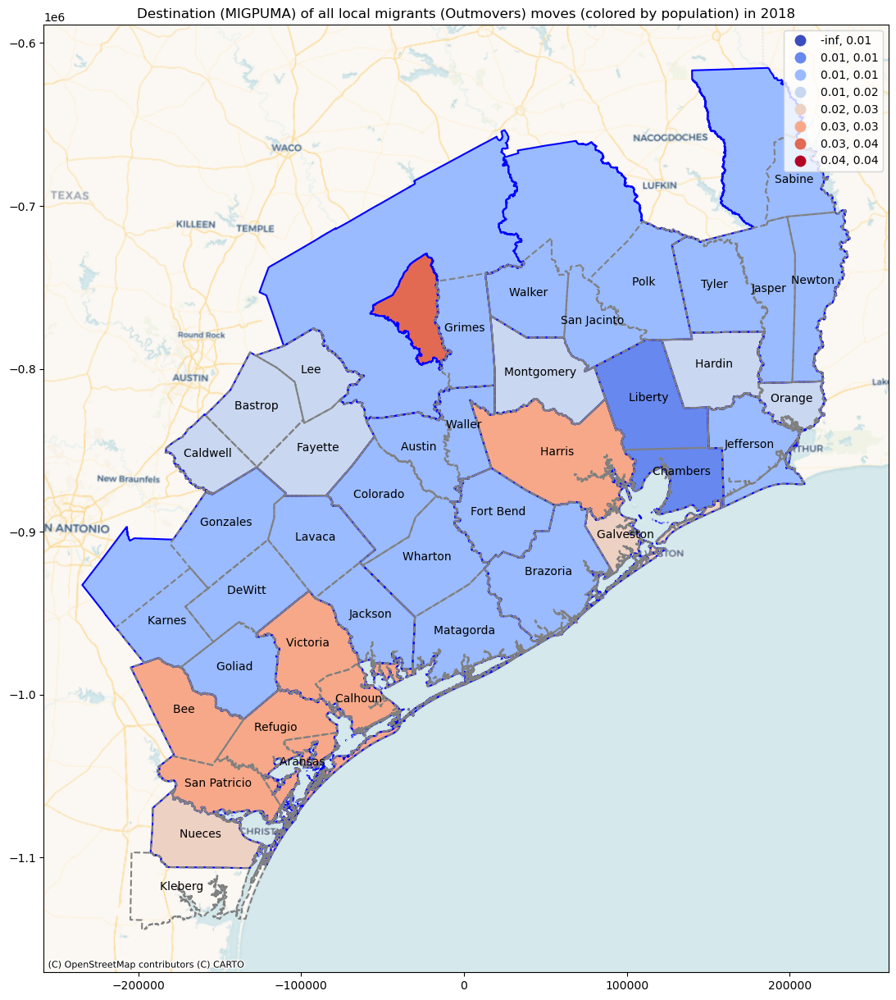

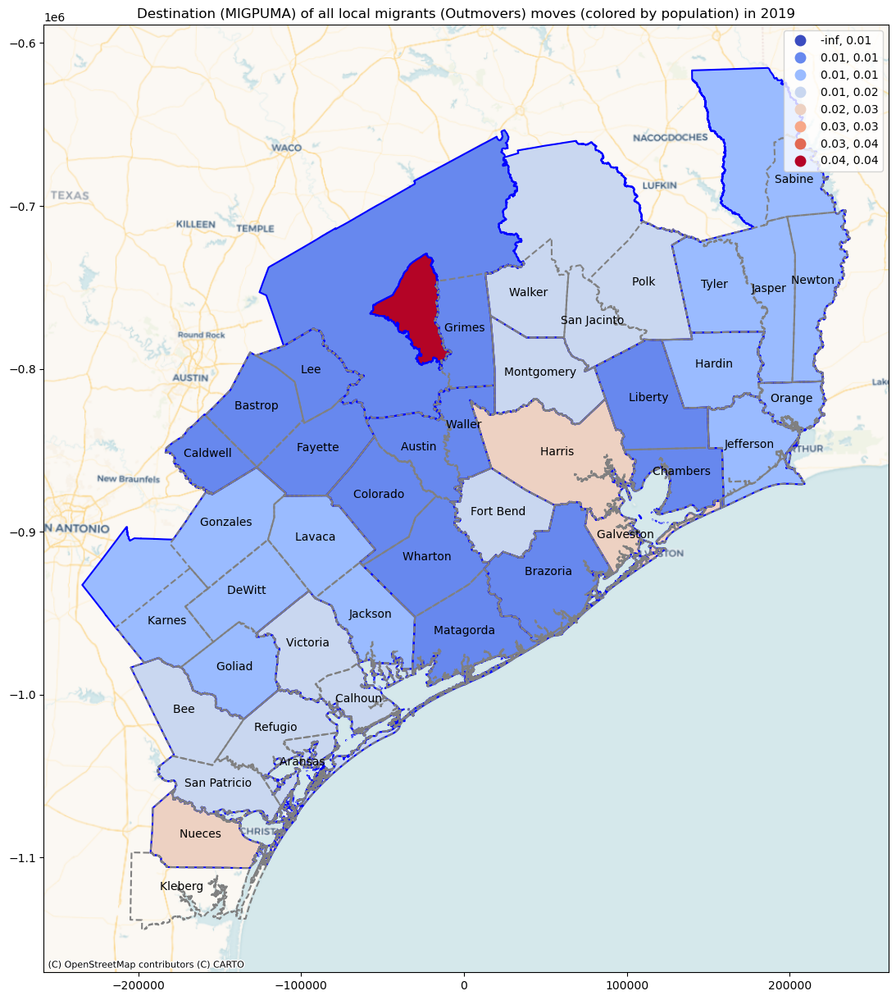

In [122]:
dest_loc(df_2015)
dest_loc(df_2016)
dest_loc(df_2017)
dest_loc(df_2018)
dest_loc(df_2019)

In [101]:
def orig_out(df):
    # Select migrants within PUMA and moving out of PUMA
    df2_loc = df[df['MIGPUMA_O'] == df['MIGPUMA_D']] # local moves
    df2_out = df[df['MIGPUMA_O'] != df['MIGPUMA_D']] # Out moves


    # Group out moves by their origins and destinations
    orig_out = df2_out.groupby('MIGPUMA_O').agg(['sum'])['PWGTP'].reset_index().rename(columns={"sum": "person"})
    orig_out = pd.merge(orig_out,migpuma_cw,how='left',left_on='MIGPUMA_O',right_on='MIGPUMA2')
    orig_out['MigPUMA10_Pop10'] = pd.to_numeric(orig_out['MigPUMA10_Pop10'].str.replace(',', ''))
    orig_out['r_person']=orig_out['person']/orig_out['MigPUMA10_Pop10'] # Ratio of migrants to the origin population
    orig_out = pd.merge(migpuma,orig_out,how='left',left_on='MIGPUMA2',right_on='MIGPUMA_O')

    fig, ax = plt.subplots()
    orig_out.sort_values(by=['r_person'],ascending = False).head(10).plot(
         color='blue',
         linewidth=0.5,                                         
         legend=True,
         ax=ax)
    df_af_county.boundary.plot(linestyle='dashed',color="grey",ax=ax)
    cx.add_basemap(ax=ax,source=cx.providers.CartoDB.Voyager,crs=df_af_county.crs)
    df_af_county.apply(lambda x: ax.annotate(text=x['NEW_NAME'], xy=x.geometry.centroid.coords[0], ha='center'), axis=1)

### Top 10 origins of long-distance migrants in each year(by ratio of migrants to origin population)

C:\Users\xiang11\AppData\Local\Temp\ipykernel_25312\2797367225.py:8: FutureWarning: ['SERIALNO'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.
  orig_out = df2_out.groupby('MIGPUMA_O').agg(['sum'])['PWGTP'].reset_index().rename(columns={"sum": "person"})
C:\Users\xiang11\AppData\Local\Temp\ipykernel_25312\2797367225.py:8: FutureWarning: ['SERIALNO'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.
  orig_out = df2_out.groupby('MIGPUMA_O').agg(['sum'])['PWGTP'].reset_index().rename(columns={"sum": "person"})


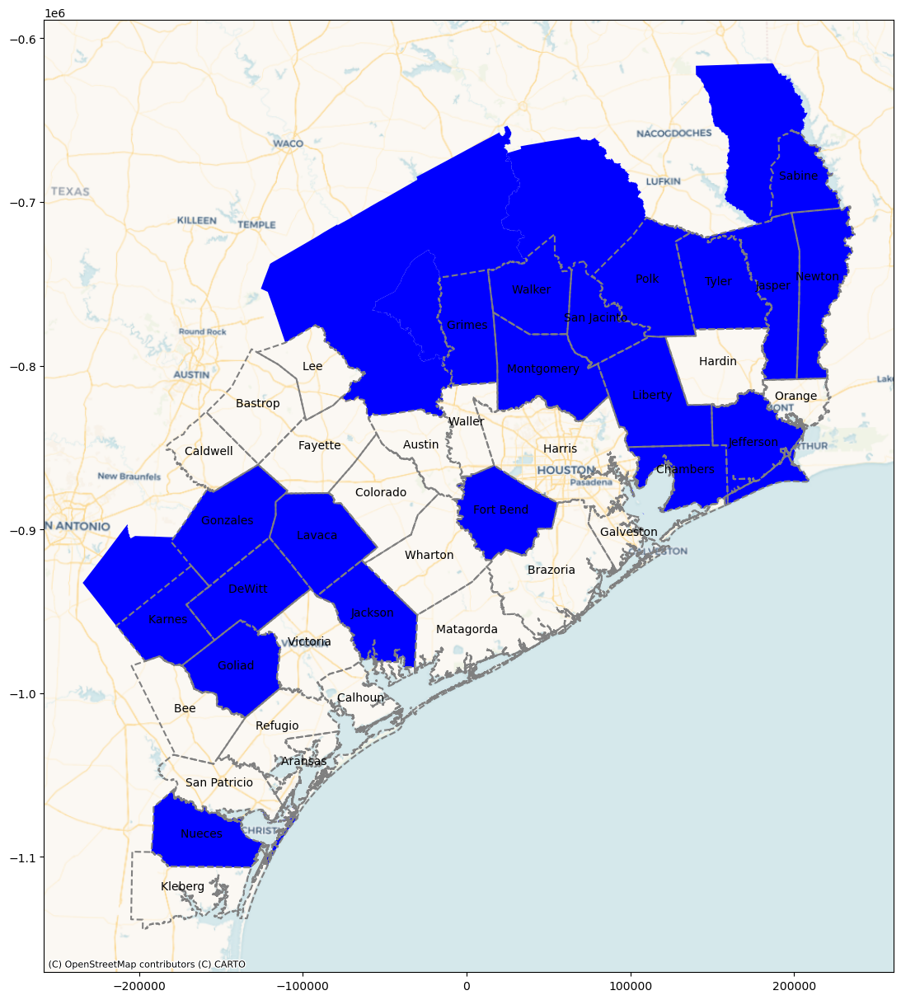

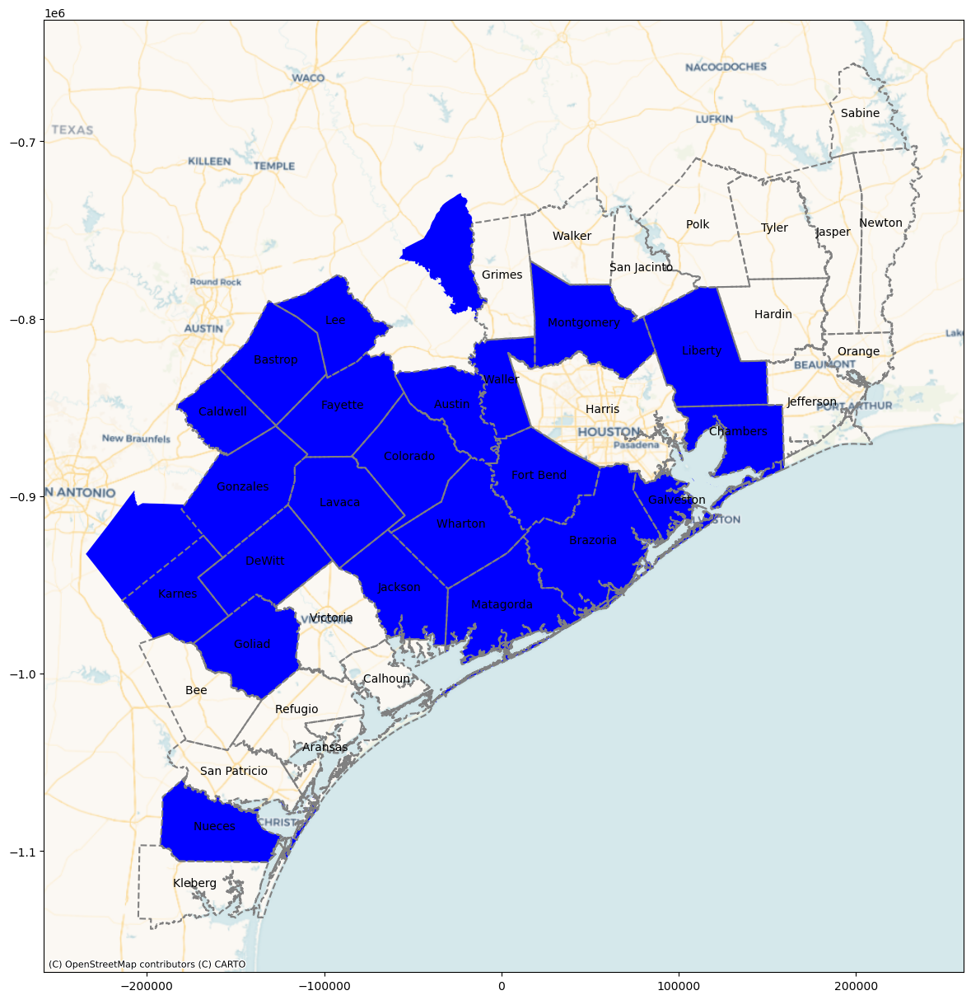

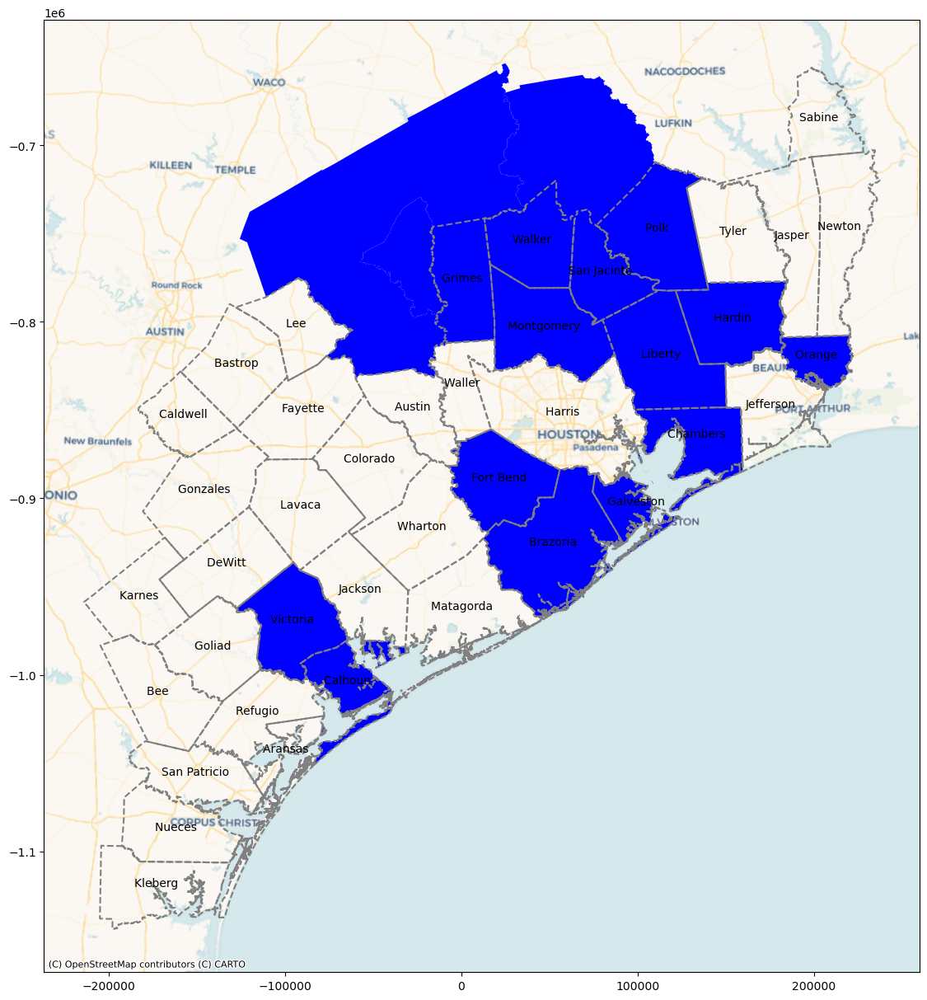

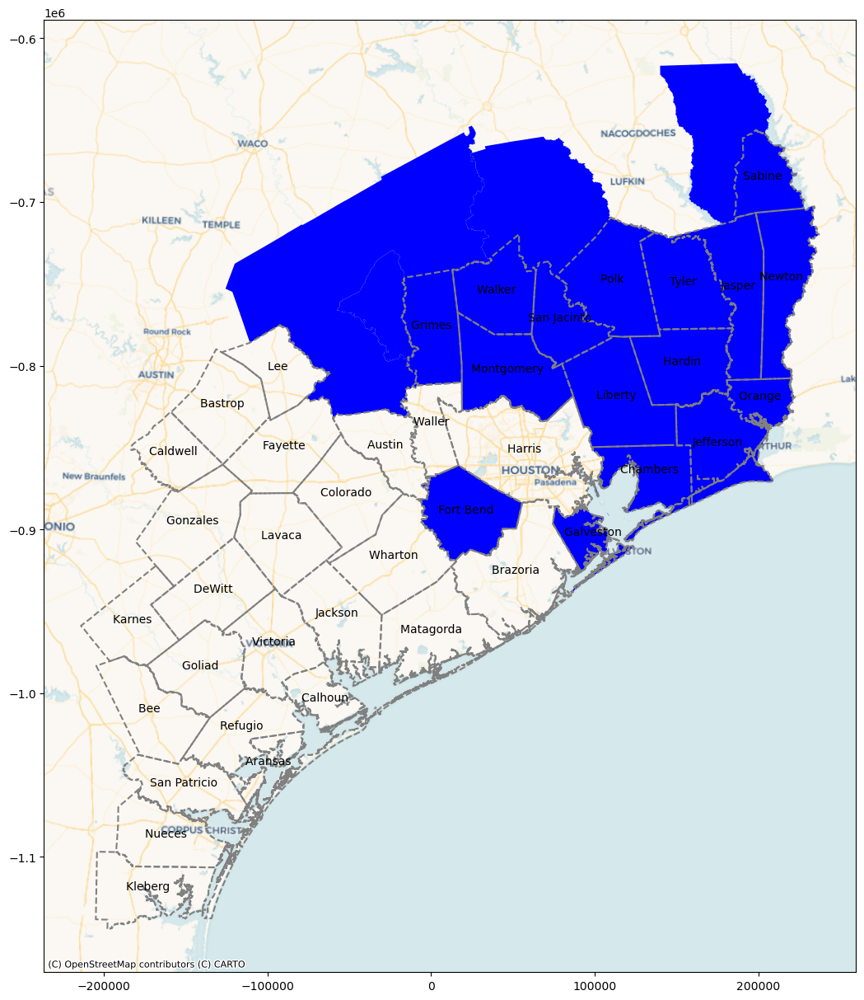

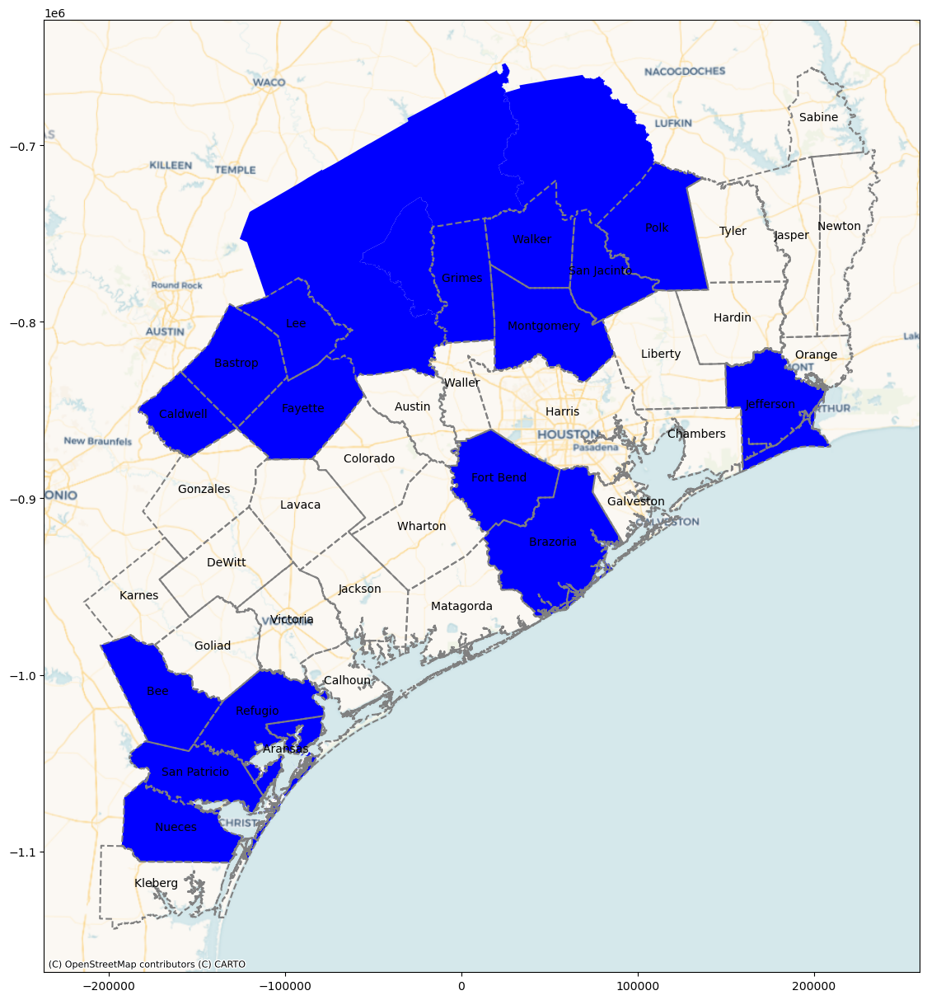

In [102]:
orig_out(df_2015)
orig_out(df_2016)
orig_out(df_2017)
orig_out(df_2018)
orig_out(df_2019)

In [103]:
def dest_out(df):
    
    # Select migrants within PUMA and moving out of PUMA
    df2_loc = df[df['MIGPUMA_O'] == df['MIGPUMA_D']] # local moves
    df2_out = df[df['MIGPUMA_O'] != df['MIGPUMA_D']] # Out moves

    # Group the migrants by their origin and destinations (MIGPUMA)
    # Group local moves by their destinations (which are also the origins)

    dest_out = df2_out.groupby('MIGPUMA_D').agg(['sum'])['PWGTP'].reset_index().rename(columns={"sum": "person"})
    
    dest_out = pd.merge(dest_out,migpuma_cw,how='left',left_on='MIGPUMA_D',right_on='MIGPUMA2')

    dest_out['MigPUMA10_Pop10'] = pd.to_numeric(dest_out['MigPUMA10_Pop10'].str.replace(',', ''))

    dest_out['r_person']=dest_out['person']/dest_out['MigPUMA10_Pop10'] # Ratio of migrants to the destination population
    
    dest_out = pd.merge(migpuma,dest_out,how='left',left_on='MIGPUMA2',right_on='MIGPUMA_D')
#     base = migpuma.plot(color='none',edgecolor='grey',linewidth=0.1)
    fig, ax = plt.subplots()
    dest_out.sort_values(by=['r_person'],ascending = False).head(10).plot(
         color='red',
         linewidth=1,                                         
         legend=True,
         ax=ax)
    df_af_county.boundary.plot(linestyle='dashed',color="grey",ax=ax)
    cx.add_basemap(ax=ax,source=cx.providers.CartoDB.Voyager,crs=df_af_county.crs)
    df_af_county.apply(lambda x: ax.annotate(text=x['NEW_NAME'], xy=x.geometry.centroid.coords[0], ha='center'), axis=1)

C:\Users\xiang11\AppData\Local\Temp\ipykernel_25312\1599674107.py:10: FutureWarning: ['SERIALNO'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.
  dest_out = df2_out.groupby('MIGPUMA_D').agg(['sum'])['PWGTP'].reset_index().rename(columns={"sum": "person"})
C:\Users\xiang11\AppData\Local\Temp\ipykernel_25312\1599674107.py:10: FutureWarning: ['SERIALNO'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.
  dest_out = df2_out.groupby('MIGPUMA_D').agg(['sum'])['PWGTP'].reset_index().rename(columns={"sum": "person"})


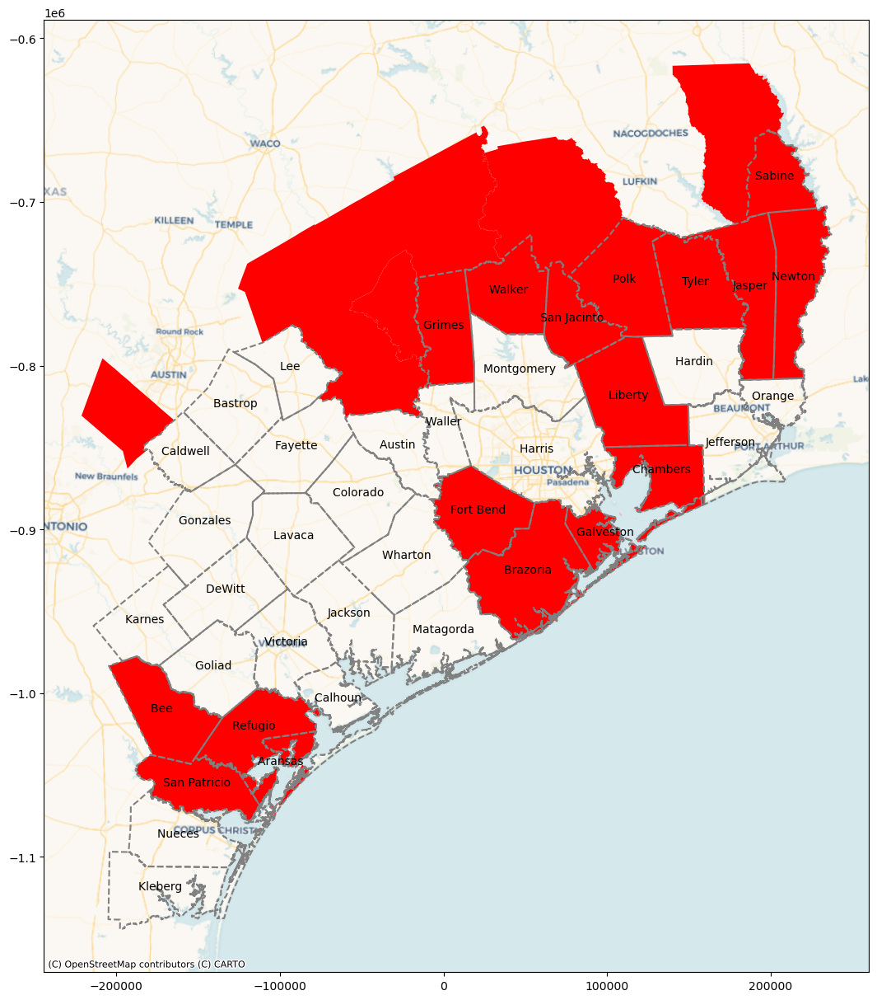

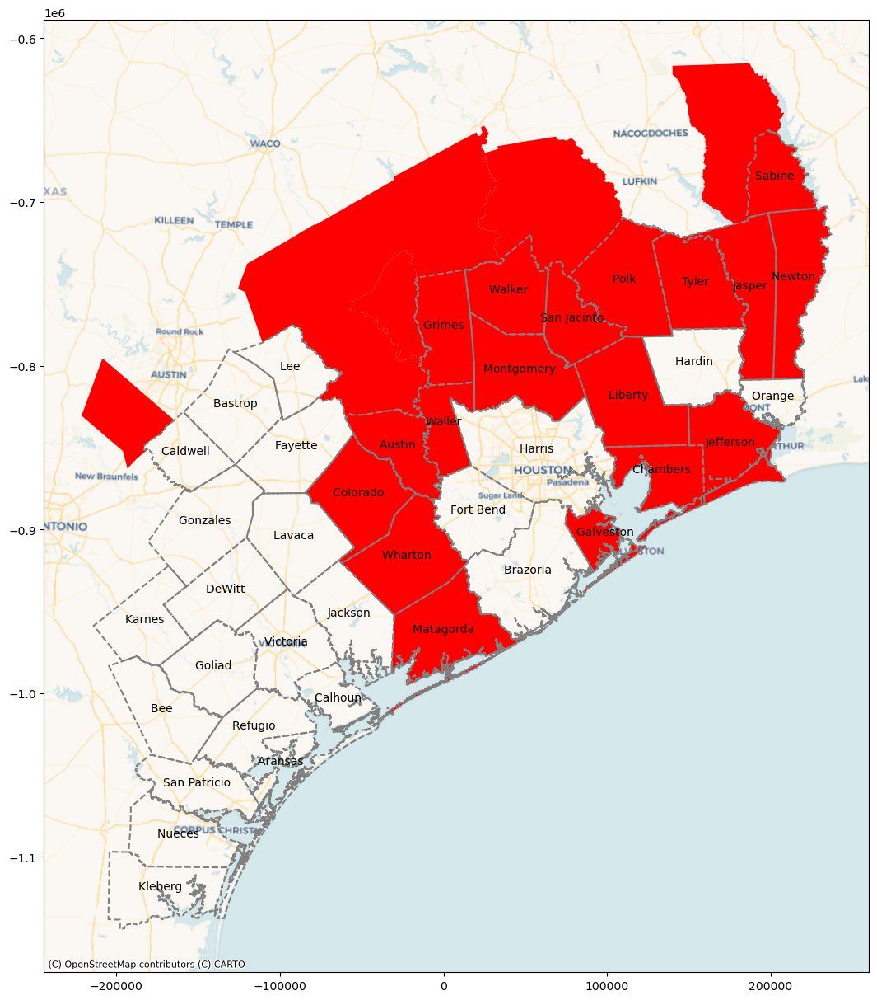

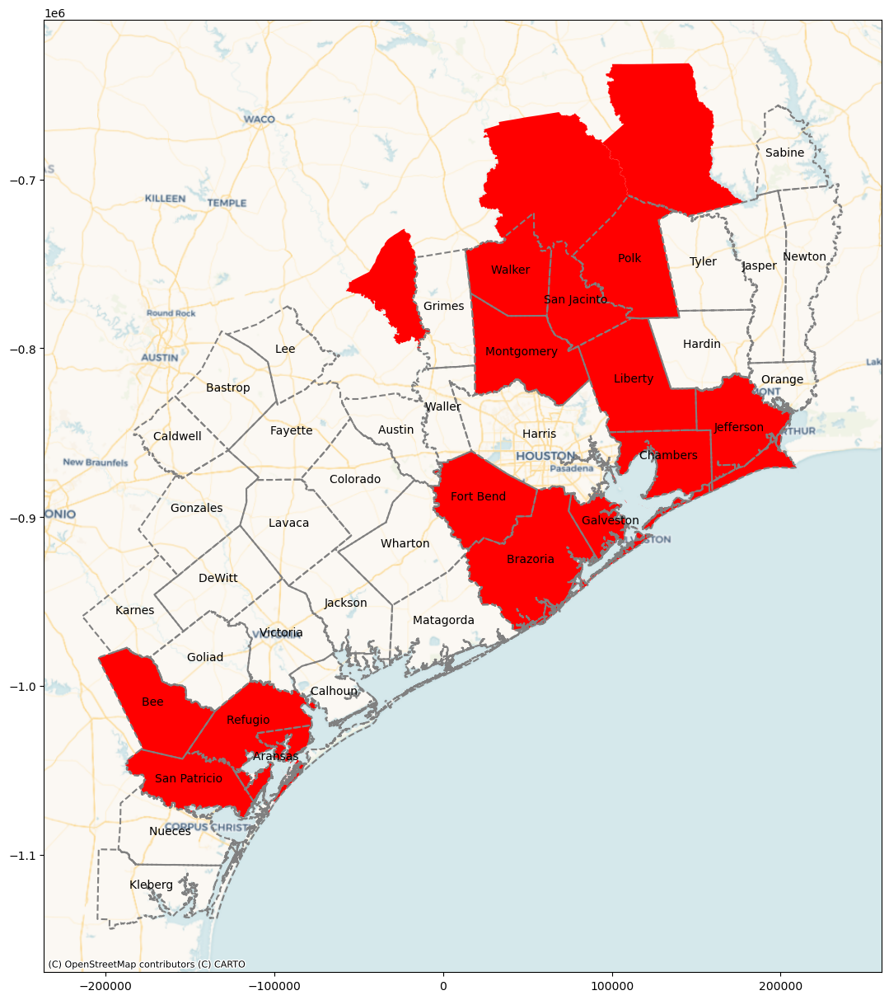

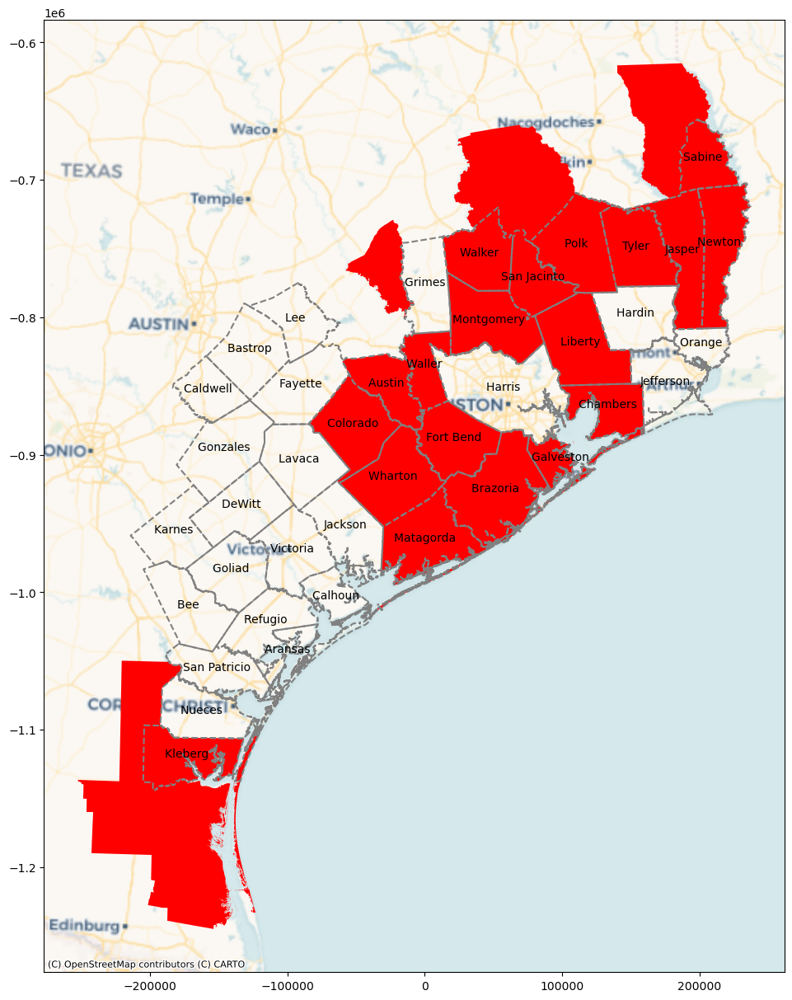

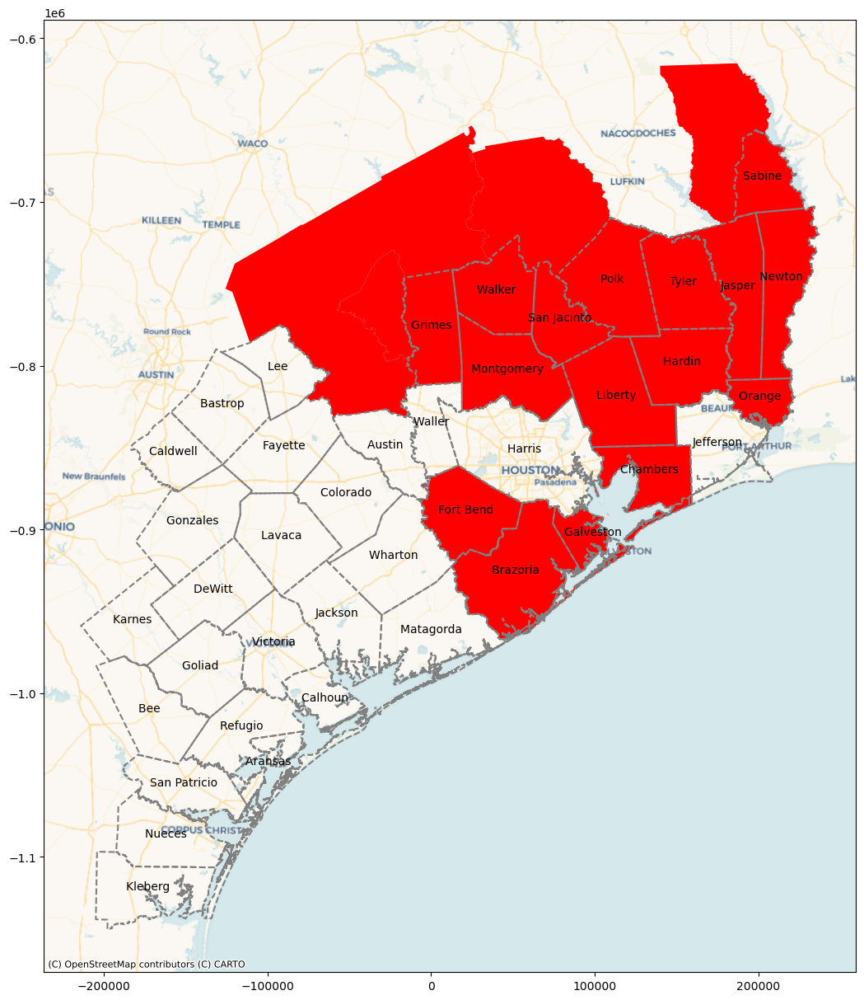

In [104]:
dest_out(df_2015)
dest_out(df_2016)
dest_out(df_2017)
dest_out(df_2018)
dest_out(df_2019)

In [105]:
df2.head()

,index,RT,SERIALNO,DIVISION,SPORDER,PUMA_x,REGION,ST_x,ADJINC,PWGTP,AGEP,CIT,CITWP,COW,DDRS,DEAR,DEYE,DOUT,DPHY,DRAT,DRATX,DREM,ENG,FER,GCL,GCM,GCR,HINS1,HINS2,HINS3,HINS4,HINS5,HINS6,HINS7,INTP,JWMNP,JWRIP,JWTRNS,LANX,MAR,MARHD,MARHM,MARHT,MARHW,MARHYP,MIG,MIL,MLPA,MLPB,MLPCD,MLPE,MLPFG,MLPH,MLPI,MLPJ,MLPK,NWAB,NWAV,NWLA,NWLK,NWRE,OIP,PAP,RELSHIPP,RETP,SCH,SCHG,SCHL,SEMP,SEX,SSIP,SSP,WAGP,WKHP,WKL,WKW,WKWN,WRK,YOEP,ANC,ANC1P,ANC2P,DECADE,DIS,DRIVESP,ESP,ESR,FOD1P,FOD2P,HICOV,HISP,INDP,JWAP,JWDP,LANP,MIGPUMA_x,MIGSP_x,MSP,NAICSP,NATIVITY,NOP,OC,OCCP,PAOC,PERNP,PINCP,POBP,POVPIP,POWPUMA,POWSP,PRIVCOV,PUBCOV,QTRBIR,RAC1P,RAC2P,RAC3P,RACAIAN,RACASN,RACBLK,RACNH,RACNUM,RACPI,RACSOR,RACWHT,RC,SCIENGP,SCIENGRLP,SFN,SFR,SOCP,VPS,WAOB,FAGEP,FANCP,FCITP,FCITWP,FCOWP,FDDRSP,FDEARP,FDEYEP,FDISP,FDOUTP,FDPHYP,FDRATP,FDRATXP,FDREMP,FENGP,FESRP,FFERP,FFODP,FGCLP,FGCMP,FGCRP,FHICOVP,FHINS1P,FHINS2P,FHINS3C,FHINS3P,FHINS4C,FHINS4P,FHINS5C,FHINS5P,FHINS6P,FHINS7P,FHISP,FINDP,FINTP,FJWDP,FJWMNP,FJWRIP,FJWTRNSP,FLANP,FLANXP,FMARP,FMARHDP,FMARHMP,FMARHTP,FMARHWP,FMARHYP,FMIGP,FMIGSP,FMILPP,FMILSP,FOCCP,FOIP,FPAP,FPERNP,FPINCP,FPOBP,FPOWSP,FPRIVCOVP,FPUBCOVP,FRACP,FRELSHIPP,FRETP,FSCHGP,FSCHLP,FSCHP,FSEMP,FSEXP,FSSIP,FSSP,FWAGP,FWKHP,FWKLP,FWKWNP,FWKWP,FWRKP,FYOEP,PWGTP1,PWGTP2,PWGTP3,PWGTP4,PWGTP5,PWGTP6,PWGTP7,PWGTP8,PWGTP9,PWGTP10,PWGTP11,PWGTP12,PWGTP13,PWGTP14,PWGTP15,PWGTP16,PWGTP17,PWGTP18,PWGTP19,PWGTP20,PWGTP21,PWGTP22,PWGTP23,PWGTP24,PWGTP25,PWGTP26,PWGTP27,PWGTP28,PWGTP29,PWGTP30,PWGTP31,PWGTP32,PWGTP33,PWGTP34,PWGTP35,PWGTP36,PWGTP37,PWGTP38,PWGTP39,PWGTP40,PWGTP41,PWGTP42,PWGTP43,PWGTP44,PWGTP45,PWGTP46,PWGTP47,PWGTP48,PWGTP49,PWGTP50,PWGTP51,PWGTP52,PWGTP53,PWGTP54,PWGTP55,PWGTP56,PWGTP57,PWGTP58,PWGTP59,PWGTP60,PWGTP61,PWGTP62,PWGTP63,PWGTP64,PWGTP65,PWGTP66,PWGTP67,PWGTP68,PWGTP69,PWGTP70,PWGTP71,PWGTP72,PWGTP73,PWGTP74,PWGTP75,PWGTP76,PWGTP77,PWGTP78,PWGTP79,PWGTP80,year,PUMA_D,MIGPUMA_O,MIGPUMA_D
0,168,P,2015000040860,6,1,01600,3,01,1080470,14,18,1,NaN,1.0,2.0,2,2,2.0,2.0,NaN,NaN,2.0,NaN,2.0,NaN,NaN,NaN,1,2,2,2,2,2,2,0.0,NaN,NaN,NaN,2.0,5,NaN,NaN,NaN,NaN,NaN,3.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,1.0,2.0,1.0,3.0,0.0,0.0,38,0.0,2.0,15.0,18.0,0.0,2,0.0,0.0,1800.0,10.0,1.0,4.0,NaN,2.0,NaN,2,51,939,NaN,2,NaN,NaN,3.0,NaN,NaN,1,1,9290.0,NaN,NaN,NaN,04600,48,6.0,814,1,NaN,0.0,4600.0,NaN,1800.0,1800.0,17,NaN,NaN,NaN,1,2,4,1,1,1,0,0,0,0,1,0,0,1,0.0,NaN,NaN,NaN,NaN,399011,NaN,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,0,NaN,0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,27,13,13,27,13,1,1,1,13,14,13,13,13,26,27,26,14,1,14,25,1,13,13,1,14,25,27,25,13,14,12,13,13,1,2,1,14,26,13,25,1,13,14,1,14,26,26,25,15,13,14,14,14,1,1,1,13,26,13,1,25,13,13,25,14,1,1,1,13,14,13,13,13,26,24,25,13,1,13,1,2015,0101600,4804600,0101590
1,998,P,2015000255289,6,1,01303,3,01,1080470,25,34,1,NaN,5.0,2.0,2,2,2.0,2.0,NaN,2.0,2.0,NaN,NaN,2.0,NaN,NaN,2,2,2,2,1,2,2,0.0,45.0,1.0,1.0,2.0,1,2.0,2.0,3.0,2.0,2013.0,3.0,2.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,5.0,3.0,3.0,3.0,30000.0,0.0,20,0.0,2.0,15.0,20.0,0.0,1,0.0,0.0,13100.0,35.0,1.0,3.0,NaN,1.0,NaN,1,210,999,NaN,2,1.0,NaN,1.0,NaN,NaN,1,2,7870.0,103.0,55.0,NaN,04600,48,2.0,611M1,1,NaN,0.0,5860.0,NaN,13100.0,43100.0,48,264.0,1300.0,1.0,1,2,2,8,67,15,0,0,0,0,1,0,1,0,0.0,NaN,NaN,NaN,NaN,439061,2.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,0,NaN,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,31,7,30,23,28,59,20,20,56,23,34,29,43,10,7,7,7,48,31,18,32,8,49,28,28,31,35,23,44,28,31,17,45,6,7,9,9,36,19,21,24,12,31,17,25,28,25,48,40,29,20,17,38,10,9,7,8,60,30,23,20,10,49,20,22,42,25,19,39,30,25,65,52,7,8,7,7,48,34,25,2015,0101303,4804600,0101300
2,1714,P,2015000437835,6,1,00500,3,01,1080470,15,68,1,NaN,NaN,2.0,2,2,2.0,2.0,NaN,NaN,2.0,NaN,NaN,2.0,NaN,NaN,1,2,1,2,2,2,2,1000.0,NaN,NaN,NaN,2.0,1,2.0,2.0,3.0,2.0,1994.0,3.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,5.0,3.0,3.0,3.0,0.0,0.0,20,

In [106]:
puma_p = gpd.read_file(GIS_path+"GIS_data/puma_p.shp")
migpuma_p = gpd.read_file(GIS_path+"GIS_data/migpuma_p.shp")

In [107]:
df3 = pd.merge(df2,migpuma_p,left_on="MIGPUMA_O",right_on="MIGPUMA2")
df3 = pd.merge(df3,puma_p,left_on="PUMA_D",right_on="PUMA2")

In [153]:
df_line = pd.DataFrame()
df_line["geometry"] = df3.apply(lambda x: LineString([x["geometry_x"],x["geometry_y"]]),axis=1)
df_line = gpd.GeoDataFrame(df_line,geometry="geometry",crs = 'ESRI:102003').to_crs("EPSG:4326")
df_line[["PWGTP","year","MIGPUMA_O","PUMA_D"]] = df3[["PWGTP","year","MIGPUMA_O","PUMA_D"]]

C:\Users\xiang11\.conda\envs\geo\lib\site-packages\pandas\core\dtypes\cast.py:128: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


In [156]:
def x_y_o_d(gdf):
    gdf['x_o'] = gdf.geometry.apply(lambda geom: geom.coords[0][0])
    gdf['y_o'] = gdf.geometry.apply(lambda geom: geom.coords[0][1])
    gdf['x_d'] = gdf.geometry.apply(lambda geom: geom.coords[1][0])
    gdf['y_d'] = gdf.geometry.apply(lambda geom: geom.coords[1][1])
    gdf['Dist'] = gdf.apply(lambda row: GD((row['y_o'], row['x_o']), (row['y_d'], row['x_d'])).km, axis=1)
    gdf = gpd.GeoDataFrame(gdf,geometry="geometry",crs ="EPSG:4326" ).to_crs('ESRI:102003')
    gdf['x_o'] = gdf.geometry.apply(lambda geom: geom.coords[0][0])
    gdf['y_o'] = gdf.geometry.apply(lambda geom: geom.coords[0][1])
    gdf['x_d'] = gdf.geometry.apply(lambda geom: geom.coords[1][0])
    gdf['y_d'] = gdf.geometry.apply(lambda geom: geom.coords[1][1])
    return gdf

In [157]:
gdf_od= x_y_o_d(df_line)

In [158]:
gdf_od

,geometry,PWGTP,year,MIGPUMA_O,PUMA_D,x_o,y_o,x_d,y_d,Dist
0,"LINESTRING (58337.659 -852896.771, 784355.859 ...",14,2015,4804600,0101600,58337.659489,-852896.770673,7.843559e+05,-445989.370345,834.307681
1,"LINESTRING (58337.659 -852896.771, 784355.859 ...",14,2015,4804600,0101600,58337.659489,-852896.770673,7.843559e+05,-445989.370345,834.307681
2,"LINESTRING (58337.659 -852896.771, 784355.859 ...",99,2016,4804600,0101600,58337.659489,-852896.770673,7.843559e+05,-445989.370345,834.307681
3,"LINESTRING (58337.659 -852896.771, 784355.859 ...",17,2017,4804600,0101600,58337.659489,-852896.770673,7.843559e+05,-445989.370345,834.307681
4,"LINESTRING (58337.659 -852896.771, 784355.859 ...",6,2017,4804600,0101600,58337.659489,-852896.770673,7.843559e+05,-445989.370345,834.307681
...,...,...,...,...,...,...,...,...,...,...
51116,"LINESTRING (-133709.218 -935188.694, 1082854.5...",13,2018,4805500,2100900,-133709.217537,-935188.694467,1.082855e+06,-7068.321476,1533.801180
51117,"LINESTRING (-133709.218 -935188.694, 1112617.3...",59,2018,4805500,2101000,-133709.217537,-935188.694467,1.112617e+06,58716.581781,1597.719278
51118,"LINESTRING (-133709.218 -935188.694, 879969.08...",3,2017,4805500,2602200,-133709.217537,-935188.694467,8.799691e+05,544284.333833,1790.333289
51119,"LINESTRING (-133709.218 -935188.694, 879969.08...",20,2017,4805500,2602200,-133709.217537,-935188.694467,8.799691e+05,544284.333833,1790.333289


In [161]:
df_line_2015 = gdf_od[gdf_od["year"]=="2015"]
df_line_2016 = gdf_od[gdf_od["year"]=="2016"]
df_line_2017 = gdf_od[gdf_od["year"]=="2017"]
df_line_2018 = gdf_od[gdf_od["year"]=="2018"]
df_line_2019 = gdf_od[gdf_od["year"]=="2019"]

In [196]:
def flowmap(gdf_od):
    gdf_od = gpd.GeoDataFrame(gdf_od,geometry="geometry").reset_index(drop=True)
    
    gdf_near = gdf_od[gdf_od["Dist"]<100]
    gdf_far  = gdf_od[gdf_od["Dist"]>=100]
    
    gdf_near = gdf_near.sort_values(by=["PWGTP"],ascending=False).reset_index()
    gdf_far  = gdf_far.sort_values(by=["PWGTP"],ascending=False).reset_index()
    
    gdf_near = gdf_near[:50].reset_index()
    gdf_far  = gdf_far[:50].reset_index()
    
    year = str(gdf_od.year[0])
    
    fig, axes = plt.subplots(1,2)
    for i in range(len(gdf_near)):
        x0 = gdf_near[i:i+1]["x_o"]
        x1 = gdf_near[i:i+1]["x_d"]
        y0 = gdf_near[i:i+1]["y_o"]
        y1 = gdf_near[i:i+1]["y_d"]
        xpos = (x0+x1)/2
        ypos = (y0+y1)/2
        xdir = x1-x0
        ydir = y1-y0
#     ax.quiver(xpos, ypos, xdir, ydir, angles="xy", zorder=5, pivot="mid")
        for X,Y,dX,dY in zip(xpos, ypos, xdir, ydir):
            axes[0].annotate("", xytext=(X,Y),xy=(X+0.001*dX,Y+0.001*dY), 
            arrowprops=dict(arrowstyle="->", color='k'), size = 10)
    gdf_near.plot(column='PWGTP',
         cmap='autumn',
         alpha = 1,
         ax=axes[0])
    cx.add_basemap(ax=axes[0],source=cx.providers.CartoDB.Voyager,crs=gdf_od.crs,alpha = 0.4)
    axes[0].set_title("Flow Map in 100km Range in " + year)
    
    for i in range(len(gdf_far)):
        x0 = gdf_far[i:i+1]["x_o"]
        x1 = gdf_far[i:i+1]["x_d"]
        y0 = gdf_far[i:i+1]["y_o"]
        y1 = gdf_far[i:i+1]["y_d"]
        xpos = (x0+x1)/2
        ypos = (y0+y1)/2
        xdir = x1-x0
        ydir = y1-y0
#     ax.quiver(xpos, ypos, xdir, ydir, angles="xy", zorder=5, pivot="mid")
        for X,Y,dX,dY in zip(xpos, ypos, xdir, ydir):
            axes[1].annotate("", xytext=(X,Y),xy=(X+0.001*dX,Y+0.001*dY), 
            arrowprops=dict(arrowstyle="->", color='k'), size = 10)
    gdf_far.plot(column='PWGTP',
         cmap='autumn',
         alpha = 1,
         ax=axes[1])
    cx.add_basemap(ax=axes[1],source=cx.providers.CartoDB.Voyager,crs=gdf_od.crs,alpha = 0.4)
    axes[1].set_title("Flow Map Beyond 100km Range in " + year)

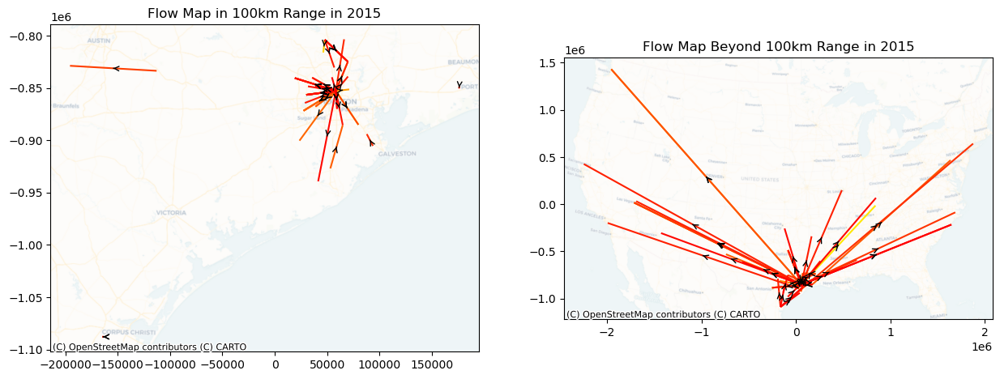

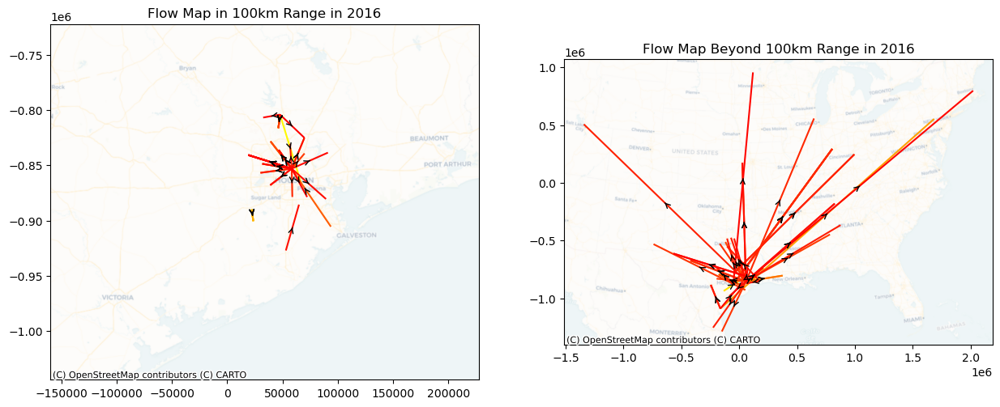

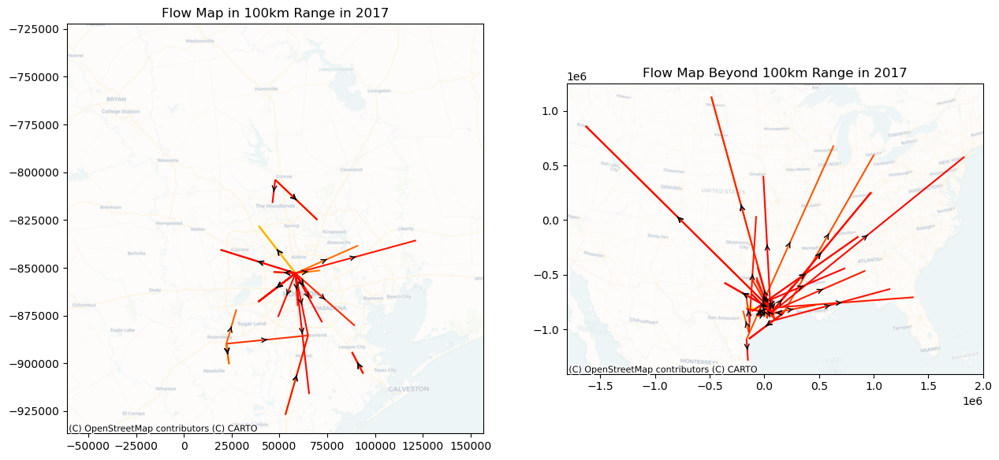

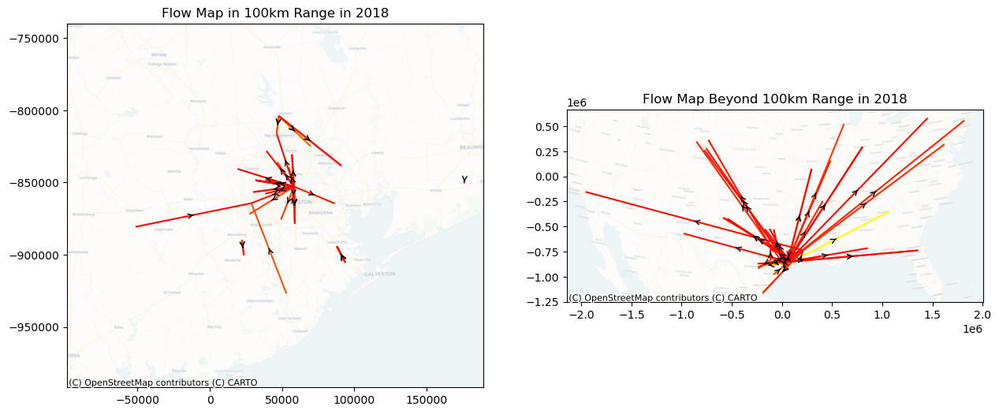

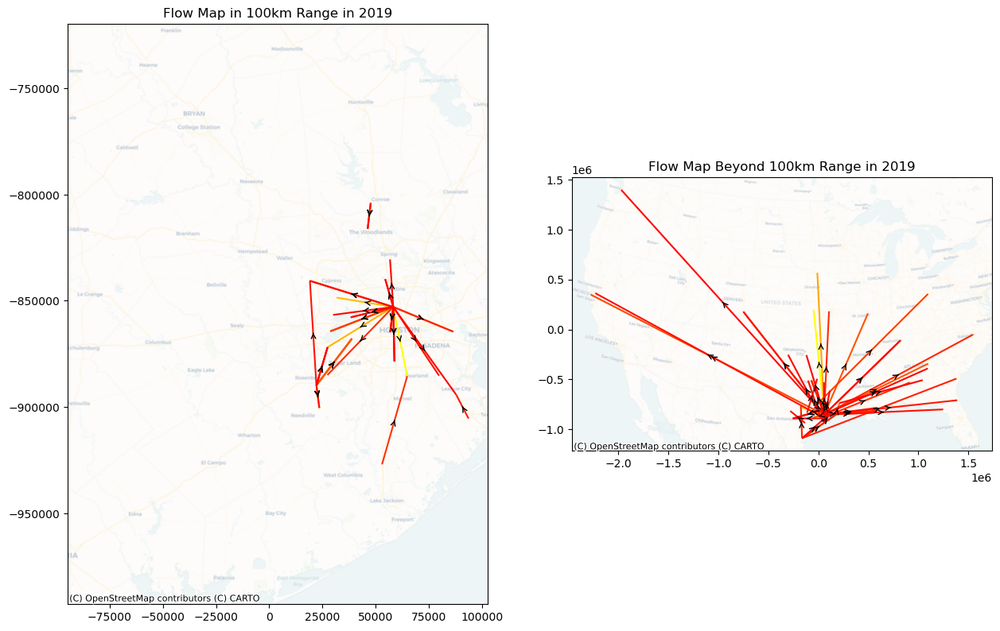

In [197]:
flowmap(df_line_2015)
flowmap(df_line_2016)
flowmap(df_line_2017)
flowmap(df_line_2018)
flowmap(df_line_2019)